In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('temperature.csv')

In [3]:
df

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.000000,0.000000,0.000000,37.6046,126.991,212.3350,2.785000,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.000000,0.000000,0.000000,37.6046,127.032,44.7624,0.514100,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.000000,0.000000,0.000000,37.5776,127.058,33.3068,0.266100,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.000000,0.000000,0.000000,37.6450,127.022,45.7160,2.534800,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.000000,0.000000,0.000000,37.5507,127.135,35.0380,0.505500,5859.552246,31.2,22.5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,23.0,30-08-2017,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,30-08-2017,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,30-08-2017,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3


In [4]:
df.head(10)

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5
5,6.0,30-06-2013,31.9,23.5,52.437126,85.307251,29.219342,23.822613,6.182295,50.231389,...,0.0,0.0,0.0,37.5102,127.042,54.6384,0.1457,5873.780762,31.5,24.0
6,7.0,30-06-2013,31.4,24.4,56.287189,81.019760,28.551859,24.238467,5.587135,125.110007,...,0.0,0.0,0.0,37.5776,126.838,12.3700,0.0985,5849.233398,30.9,23.4
7,8.0,30-06-2013,32.1,23.6,52.326218,78.004539,28.851982,23.819054,6.104417,42.011547,...,0.0,0.0,0.0,37.4697,126.910,52.5180,1.5629,5863.992188,31.1,22.9
8,9.0,30-06-2013,31.4,22.0,55.338791,80.784607,28.426975,23.332373,6.017135,85.110971,...,0.0,0.0,0.0,37.4967,126.826,50.9312,0.4125,5876.901367,31.3,21.6
9,10.0,30-06-2013,31.6,20.5,56.651203,86.849632,27.576705,22.527018,6.518841,63.006075,...,0.0,0.0,0.0,37.4562,126.955,208.5070,5.1782,5893.608398,30.5,21.0


In [5]:
df.tail(10)

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
7742,18.0,30-08-2017,23.3,18.2,30.259682,86.565193,26.474403,17.289157,6.522731,94.203783,...,0.000000,0.000000,0.000000,37.4832,127.024,56.4448,1.231300,4435.611816,27.8,16.7
7743,19.0,30-08-2017,22.6,15.0,25.536045,78.779045,26.596280,17.856040,6.905963,54.030075,...,0.000000,0.000000,0.000000,37.5776,126.938,75.0924,1.767800,4495.473633,27.1,16.6
7744,20.0,30-08-2017,22.7,15.9,38.216373,94.428116,24.037222,15.772677,6.478060,112.580310,...,0.000000,0.000000,0.000000,37.6181,127.004,146.5540,4.729600,4554.965332,26.7,16.3
7745,21.0,30-08-2017,23.1,17.8,24.688997,78.261383,27.812697,18.303014,6.603253,9.614074,...,0.000000,0.000000,0.000000,37.5507,127.040,26.2980,0.572100,4456.024414,27.6,17.7
7746,22.0,30-08-2017,22.5,17.4,30.094858,83.690018,26.704905,17.814038,5.768083,82.146707,...,0.000000,0.000000,0.000000,37.5102,127.086,21.9668,0.133200,4441.803711,28.0,17.1
7747,23.0,30-08-2017,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,0.000000,0.000000,0.000000,37.5372,126.891,15.5876,0.155400,4443.313965,28.3,18.1
7748,24.0,30-08-2017,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,0.000000,0.000000,0.000000,37.5237,126.909,17.2956,0.222300,4438.373535,28.6,18.8
7749,25.0,30-08-2017,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,0.000000,0.000000,0.000000,37.5237,126.970,19.5844,0.271300,4451.345215,27.8,17.4
7750,NaN,NaN,20.0,11.3,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,...,0.000000,0.000000,0.000000,37.4562,126.826,12.3700,0.098475,4329.520508,17.4,11.3
7751,NaN,NaN,37.6,29.9,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,...,21.621661,15.841235,16.655469,37.6450,127.135,212.3350,5.178230,5992.895996,38.9,29.8


In [6]:
df.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

In [7]:
#Here we can see that there are quite a lot of null values

In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7750 non-null   float64
 1   Date              7750 non-null   object 
 2   Present_Tmax      7682 non-null   float64
 3   Present_Tmin      7682 non-null   float64
 4   LDAPS_RHmin       7677 non-null   float64
 5   LDAPS_RHmax       7677 non-null   float64
 6   LDAPS_Tmax_lapse  7677 non-null   float64
 7   LDAPS_Tmin_lapse  7677 non-null   float64
 8   LDAPS_WS          7677 non-null   float64
 9   LDAPS_LH          7677 non-null   float64
 10  LDAPS_CC1         7677 non-null   float64
 11  LDAPS_CC2         7677 non-null   float64
 12  LDAPS_CC3         7677 non-null   float64
 13  LDAPS_CC4         7677 non-null   float64
 14  LDAPS_PPT1        7677 non-null   float64
 15  LDAPS_PPT2        7677 non-null   float64
 16  LDAPS_PPT3        7677 non-null   float64


In [9]:
df.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
count,7750.000000,7682.000000,7682.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,7677.000000,...,7677.000000,7677.000000,7677.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7725.000000,7725.000000
mean,13.000000,29.768211,23.225059,56.759372,88.374804,29.613447,23.512589,7.097875,62.505019,0.368774,...,0.485003,0.278200,0.269407,37.544722,126.991397,61.867972,1.257048,5341.502803,30.274887,22.932220
std,7.211568,2.969999,2.413961,14.668111,7.192004,2.947191,2.345347,2.183836,33.730589,0.262458,...,1.762807,1.161809,1.206214,0.050352,0.079435,54.279780,1.370444,429.158867,3.128010,2.487613
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,...,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000,11.300000
25%,7.000000,27.800000,21.700000,45.963543,84.222862,27.673499,22.089739,5.678705,37.266753,0.146654,...,0.000000,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,21.300000
50%,13.000000,29.900000,23.400000,55.039024,89.793480,29.703426,23.760199,6.547470,56.865482,0.315697,...,0.000000,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000,23.100000
75%,19.000000,32.000000,24.900000,67.190056,93.743629,31.710450,25.152909,8.032276,84.223616,0.575489,...,0.018364,0.007896,0.000041,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000,24.600000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,...,21.621661,15.841235,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000,29.800000


In [10]:
#We can see that some data are rightly skewed - latent heat flux, DEM, slope, solar radiation etc. ALso, the differences in 75th percentile and max shows the presence of outliers. 

In [11]:
df.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

In [12]:
df.duplicated().sum()

0

In [13]:
df.isin(['NA',' ','-']).sum().any()

False

In [14]:
Data_Missing=df.isnull().sum()*100/len(df)

In [15]:
Data_Missing

station             0.025800
Date                0.025800
Present_Tmax        0.902993
Present_Tmin        0.902993
LDAPS_RHmin         0.967492
LDAPS_RHmax         0.967492
LDAPS_Tmax_lapse    0.967492
LDAPS_Tmin_lapse    0.967492
LDAPS_WS            0.967492
LDAPS_LH            0.967492
LDAPS_CC1           0.967492
LDAPS_CC2           0.967492
LDAPS_CC3           0.967492
LDAPS_CC4           0.967492
LDAPS_PPT1          0.967492
LDAPS_PPT2          0.967492
LDAPS_PPT3          0.967492
LDAPS_PPT4          0.967492
lat                 0.000000
lon                 0.000000
DEM                 0.000000
Slope               0.000000
Solar radiation     0.000000
Next_Tmax           0.348297
Next_Tmin           0.348297
dtype: float64

In [16]:
Total_Values=df.size
Total_Missing=df.isnull().sum().sum()
Overall_Missing_Percentage=(Total_Missing/Total_Values)*100
print(f"Overall Missing data: {Overall_Missing_Percentage:.2f}%")

Overall Missing data: 0.64%


In [17]:
#This missing values are very minimal 

In [18]:
df.dropna(inplace=True)

In [19]:
df.isnull().sum()

station             0
Date                0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
dtype: int64

In [20]:
#Now we no longer have null values 

In [21]:
df['Date'] = pd.to_datetime(df['Date'])
df['Day'] = df['Date'].dt.day
df['Month'] = df['Date'].dt.month
df['Year'] = df['Date'].dt.year

In [22]:
df

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month,Year
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2,30,6,2013
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5,30,6,2013
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9,30,6,2013
3,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3,30,6,2013
4,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5,30,6,2013
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,21.0,2017-08-30,23.1,17.8,24.688997,78.261383,27.812697,18.303014,6.603253,9.614074,...,37.5507,127.040,26.2980,0.5721,4456.024414,27.6,17.7,30,8,2017
7746,22.0,2017-08-30,22.5,17.4,30.094858,83.690018,26.704905,17.814038,5.768083,82.146707,...,37.5102,127.086,21.9668,0.1332,4441.803711,28.0,17.1,30,8,2017
7747,23.0,2017-08-30,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,37.5372,126.891,15.5876,0.1554,4443.313965,28.3,18.1,30,8,2017
7748,24.0,2017-08-30,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,37.5237,126.909,17.2956,0.2223,4438.373535,28.6,18.8,30,8,2017


In [23]:
df.tail()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month,Year
7745,21.0,2017-08-30,23.1,17.8,24.688997,78.261383,27.812697,18.303014,6.603253,9.614074,...,37.5507,127.040,26.2980,0.5721,4456.024414,27.6,17.7,30,8,2017
7746,22.0,2017-08-30,22.5,17.4,30.094858,83.690018,26.704905,17.814038,5.768083,82.146707,...,37.5102,127.086,21.9668,0.1332,4441.803711,28.0,17.1,30,8,2017
7747,23.0,2017-08-30,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,37.5372,126.891,15.5876,0.1554,4443.313965,28.3,18.1,30,8,2017
7748,24.0,2017-08-30,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,37.5237,126.909,17.2956,0.2223,4438.373535,28.6,18.8,30,8,2017
7749,25.0,2017-08-30,23.2,17.4,22.933014,77.243744,27.939516,18.522965,7.289264,9.090034,...,37.5237,126.970,19.5844,0.2713,4451.345215,27.8,17.4,30,8,2017


In [24]:
!pip install geopy
from geopy.geocoders import Nominatim

In [25]:
!pip install reverse_geocoder
import reverse_geocoder as RG
import pprint
from geopy.geocoders import Nominatim
import time

GeoData=[]
def reverse_GEODATA(coords):
    output = RG.search(coords)
    return (output)

if __name__=="__main__":
    coords = list(zip(df['lat'], df['lon']))
    dataset = reverse_GEODATA(coords)
    GeoData.append(dataset)
GEOData = pd.DataFrame(GeoData).transpose()


Loading formatted geocoded file...


In [26]:
df['City'] = GEOData[0].apply(lambda x: x['name'] if x and 'name' in x else None)

In [27]:
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month,Year,City
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,126.991,212.3350,2.7850,5992.895996,29.1,21.2,30,6,2013,Seoul
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,127.032,44.7624,0.5141,5869.312500,30.5,22.5,30,6,2013,Seoul
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,127.058,33.3068,0.2661,5863.555664,31.1,23.9,30,6,2013,Seoul
3,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,127.022,45.7160,2.5348,5856.964844,31.7,24.3,30,6,2013,Seoul
4,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,127.135,35.0380,0.5055,5859.552246,31.2,22.5,30,6,2013,Guri-si


In [28]:
df.nunique()

station               25
Date                 307
Present_Tmax         167
Present_Tmin         155
LDAPS_RHmin         7585
LDAPS_RHmax         7577
LDAPS_Tmax_lapse    7588
LDAPS_Tmin_lapse    7588
LDAPS_WS            7588
LDAPS_LH            7588
LDAPS_CC1           7485
LDAPS_CC2           7496
LDAPS_CC3           7512
LDAPS_CC4           7438
LDAPS_PPT1          2779
LDAPS_PPT2          2479
LDAPS_PPT3          2326
LDAPS_PPT4          1892
lat                   12
lon                   25
DEM                   25
Slope                 25
Solar radiation     1575
Next_Tmax            181
Next_Tmin            157
Day                   31
Month                  3
Year                   5
City                   7
dtype: int64

In [29]:
#Since the task is to look into the Next_Tmax and Next_Tmin. I will be first looking at Next_Tmax and we can see that this is a regression problem since the unique values are higher and values are continous

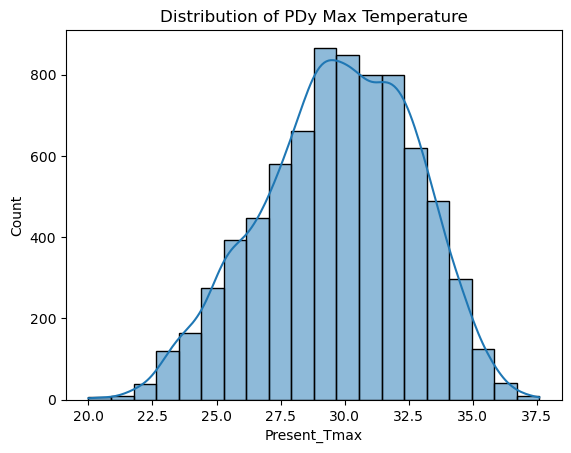

In [30]:
sns.histplot(df['Present_Tmax'], bins=20, kde=True)
plt.title('Distribution of PDy Max Temperature')
plt.show()

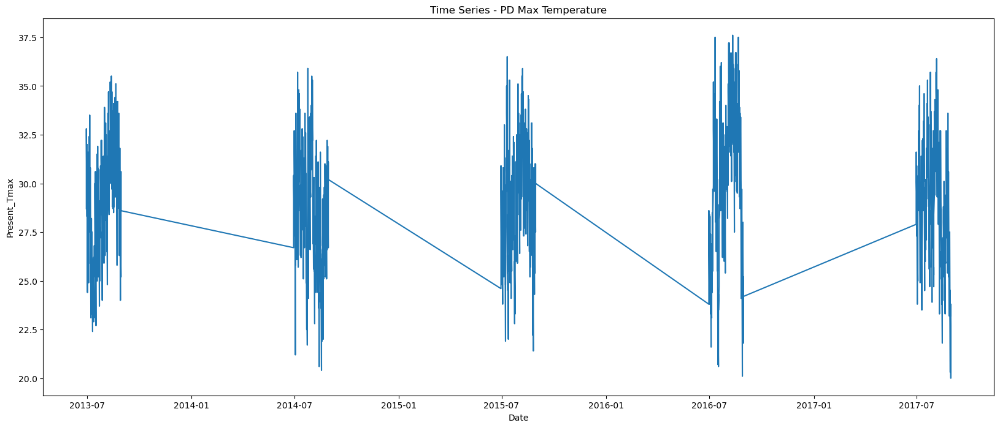

In [31]:
plt.figure(figsize=(20, 8))
plt.plot(df['Date'], df['Present_Tmax'])
plt.title('Time Series - PD Max Temperature')
plt.xlabel('Date')
plt.ylabel('Present_Tmax')
plt.show()

In [32]:
#We can see seasonal changes which changes the max temperatures. Here we can also see some outliers through looking at the sharp lines 

In [33]:
#Here we can see the max value has been 37.6 followed by min which is 20 and the average was around 29

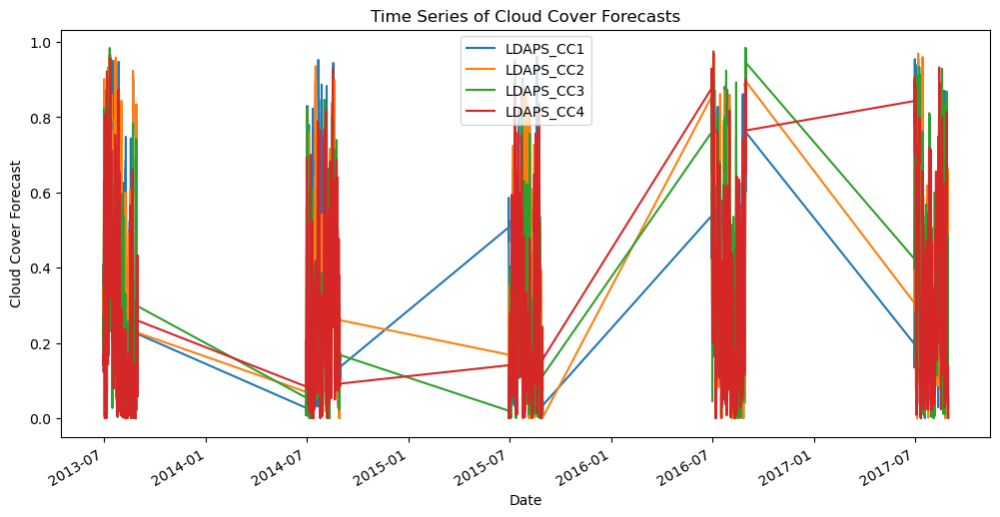

In [34]:
df.set_index('Date')[['LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4']].plot(figsize=(12, 6))
plt.title('Time Series of Cloud Cover Forecasts')
plt.ylabel('Cloud Cover Forecast')
plt.show()

In [35]:
df

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month,Year,City
0,1.0,2013-06-30,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,126.991,212.3350,2.7850,5992.895996,29.1,21.2,30,6,2013,Seoul
1,2.0,2013-06-30,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,127.032,44.7624,0.5141,5869.312500,30.5,22.5,30,6,2013,Seoul
2,3.0,2013-06-30,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,127.058,33.3068,0.2661,5863.555664,31.1,23.9,30,6,2013,Seoul
3,4.0,2013-06-30,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,127.022,45.7160,2.5348,5856.964844,31.7,24.3,30,6,2013,Seoul
4,5.0,2013-06-30,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,127.135,35.0380,0.5055,5859.552246,31.2,22.5,30,6,2013,Guri-si
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,21.0,2017-08-30,23.1,17.8,24.688997,78.261383,27.812697,18.303014,6.603253,9.614074,...,127.040,26.2980,0.5721,4456.024414,27.6,17.7,30,8,2017,NaN
7746,22.0,2017-08-30,22.5,17.4,30.094858,83.690018,26.704905,17.814038,5.768083,82.146707,...,127.086,21.9668,0.1332,4441.803711,28.0,17.1,30,8,2017,NaN
7747,23.0,2017-08-30,23.3,17.1,26.741310,78.869858,26.352081,18.775678,6.148918,72.058294,...,126.891,15.5876,0.1554,4443.313965,28.3,18.1,30,8,2017,NaN
7748,24.0,2017-08-30,23.3,17.7,24.040634,77.294975,27.010193,18.733519,6.542819,47.241457,...,126.909,17.2956,0.2223,4438.373535,28.6,18.8,30,8,2017,NaN


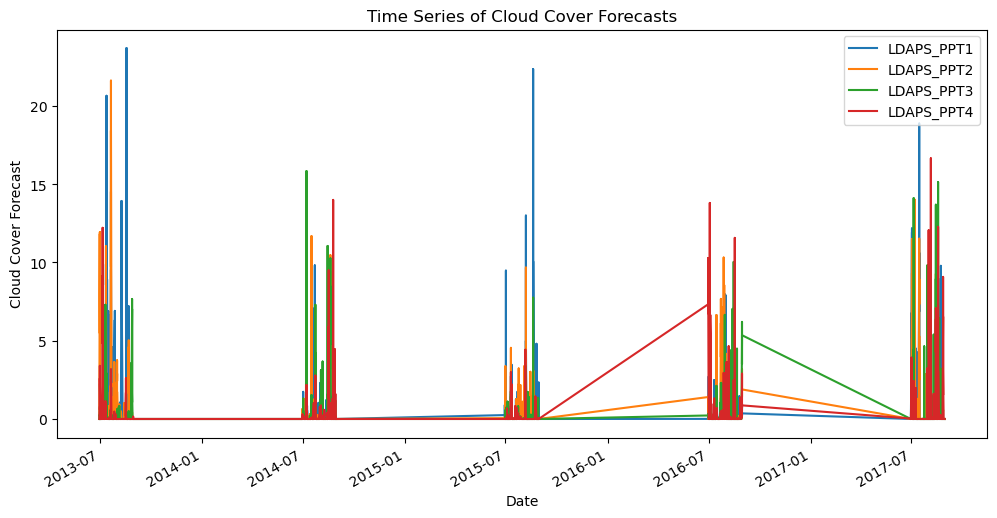

In [36]:
df.set_index('Date')[['LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4']].plot(figsize=(12, 6))
plt.title('Time Series of Cloud Cover Forecasts')
plt.ylabel('Cloud Cover Forecast')
plt.show()

In [37]:
temp_by_city = df.groupby('City')['Present_Tmax'].mean().reset_index()
temp_sort = temp_by_city.sort_values('Present_Tmax', ascending=False)
print(temp_sort)

          City  Present_Tmax
1   Bucheon-si     30.002020
4   Kwangmyong     29.959560
0    Anyang-si     29.855921
3      Guri-si     29.850464
6        Seoul     29.766624
2    Goyang-si     29.728716
5  Seongnam-si     29.717508


In [38]:
df.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin', 'Day',
       'Month', 'Year', 'City'],
      dtype='object')

In [39]:
temp_by_city = df.groupby(['City', 'Month', 'Year', 'Day', 'station'])['Present_Tmax'].max().reset_index()
temp_sort = temp_by_city.sort_values('Present_Tmax', ascending=False)
top10 = temp_sort.head(10)
print(top10)

            City  Month  Year  Day  station  Present_Tmax
560   Bucheon-si      8  2016   11     18.0          37.6
270    Anyang-si      8  2016   21     18.0          37.5
4958       Seoul      7  2016   11     18.0          37.5
6799       Seoul      8  2016    4     18.0          37.2
1905     Guri-si      8  2016    5     22.0          37.2
6812       Seoul      8  2016    5     18.0          37.1
1930     Guri-si      8  2016   11     22.0          36.9
3076  Kwangmyong      8  2016    5     25.0          36.8
6808       Seoul      8  2016    5     13.0          36.8
7010       Seoul      8  2016   21     23.0          36.8


In [40]:
#The max temperature has been experienced by Bucheon-si, station 18 in 2016 (Beginning of August)

In [41]:
temp_by_city = df.groupby(['City', 'Month', 'Year', 'Day', 'station'])['Present_Tmax'].min().reset_index()
temp_sort1 = temp_by_city.sort_values('Present_Tmax', ascending=True)
Top10min = temp_sort1.head(10)
print(Top10min)

         City  Month  Year  Day  station  Present_Tmax
7089    Seoul      8  2016   28      1.0          20.1
6201    Seoul      8  2014   18      1.0          20.4
5025    Seoul      7  2016   17      1.0          20.6
6149    Seoul      8  2014   14      1.0          20.6
5012    Seoul      7  2016   16      1.0          20.7
4043    Seoul      7  2014    3      1.0          21.2
1866  Guri-si      8  2015   26      1.0          21.4
1350  Guri-si      7  2016   16      2.0          21.5
5022    Seoul      7  2016   16     17.0          21.5
4856    Seoul      7  2016    4      1.0          21.6


In [42]:
#The max-min temperature of 20 has been experienced by Anyang-si in station 1.0, 2016

In [43]:
temp_by_city = df.groupby(['City', 'Month', 'Year', 'Day', 'station'])['Present_Tmin'].min().reset_index()
temp_sort3 = temp_by_city.sort_values('Present_Tmin', ascending=True)
Top10m = temp_sort3.head(10)
print(Top10m)

             City  Month  Year  Day  station  Present_Tmin
7083        Seoul      8  2016   27     17.0          11.3
7077        Seoul      8  2016   27      2.0          13.5
3536  Seongnam-si      8  2016   29     17.0          13.6
3162   Kwangmyong      8  2016   29     10.0          14.2
70      Anyang-si      7  2015    4     17.0          14.3
3167   Kwangmyong      8  2016   30     17.0          14.4
7079        Seoul      8  2016   27     10.0          14.8
7082        Seoul      8  2016   27     16.0          15.1
7114        Seoul      8  2016   30      1.0          15.2
373    Bucheon-si      7  2015    4     16.0          15.3


In [44]:
#The lowest of lowest temperature was 11.3 recorded in Guri-si at station 17 (Month: End of August)

In [45]:
temp_by_city = df.groupby(['City', 'Month', 'Year', 'Day', 'station'])['Present_Tmin'].max().reset_index()
temp_sort22 = temp_by_city.sort_values('Present_Tmin', ascending=False)
Top10 = temp_sort22.head(10)
print(Top10)

             City  Month  Year  Day  station  Present_Tmin
1652      Guri-si      8  2014    2     23.0          29.9
2826   Kwangmyong      8  2014    2     24.0          29.7
3449  Seongnam-si      8  2014    2      7.0          29.6
2825   Kwangmyong      8  2014    2     18.0          29.2
2824   Kwangmyong      8  2014    2      9.0          29.2
6006        Seoul      8  2014    2     25.0          29.1
2020      Guri-si      8  2017    5     23.0          29.0
7190        Seoul      8  2017    5     24.0          29.0
2823   Kwangmyong      8  2014    2      8.0          28.9
7010        Seoul      8  2016   21     23.0          28.9


In [46]:
#The highest of lowest temperature was 29.9 recorded in Guri-si, station: 23

In [47]:
temp_by_city = df.groupby(['City', 'Month', 'Year', 'Day', 'station'])['LDAPS_RHmin'].max().reset_index()
temp_sort7 = temp_by_city.sort_values('LDAPS_RHmin', ascending=False)
Top10 = temp_sort7.head(10)
print(Top10)

            City  Month  Year  Day  station  LDAPS_RHmin
4868       Seoul      7  2016    4     20.0    98.524734
7122       Seoul      8  2016   30     20.0    98.194176
5231       Seoul      7  2017    2     20.0    97.482574
4726       Seoul      7  2015   24     20.0    96.933922
4857       Seoul      7  2016    4      4.0    96.564728
2615  Kwangmyong      7  2017    7     20.0    96.169815
577   Bucheon-si      8  2016   30      4.0    96.087349
3747       Seoul      7  2013   11      1.0    95.818939
7114       Seoul      8  2016   30      1.0    95.803284
3895       Seoul      7  2013   22     20.0    95.752686


In [48]:
#The highest of lowest humidity was 98 recorded in Seoul, station=20 in 2016

In [49]:
temp_by_city = df.groupby(['City', 'Month', 'Year', 'Day', 'station'])['LDAPS_RHmin'].min().reset_index()
temp_sort = temp_by_city.sort_values('LDAPS_RHmin')
Top10 = temp_sort.head(10)
print(Top10)

         City  Month  Year  Day  station  LDAPS_RHmin
4122    Seoul      7  2014    9      3.0    19.794666
1075  Guri-si      7  2014    9     21.0    20.090685
4129    Seoul      7  2014    9     13.0    21.009708
4133    Seoul      7  2014    9     25.0    21.469881
4127    Seoul      7  2014    9     11.0    21.663679
4125    Seoul      7  2014    9      6.0    22.087887
4130    Seoul      7  2014    9     14.0    22.338659
4128    Seoul      7  2014    9     12.0    22.426592
1074  Guri-si      7  2014    9     15.0    22.870527
4132    Seoul      7  2014    9     22.0    24.289913


In [50]:
#The lowest of lowest humditiy was 19 recorded in Seoul in 2014 July at station 3.0

In [51]:
temp_by_city = df.groupby(['City', 'Month', 'Year', 'Day', 'station'])['LDAPS_RHmax'].max().reset_index()
temp_sort = temp_by_city.sort_values('LDAPS_RHmax', ascending=False)
Top10 = temp_sort.head(10)
print(Top10)

            City  Month  Year  Day  station  LDAPS_RHmax
5220       Seoul      7  2017    2      1.0   100.000153
5231       Seoul      7  2017    2     20.0    99.999420
1412     Guri-si      7  2017    1     20.0    99.999008
725    Goyang-si      7  2016   26     20.0    99.996887
5024       Seoul      7  2016   16     20.0    99.995171
1390     Guri-si      7  2016   26      1.0    99.992661
429   Bucheon-si      7  2017    1      1.0    99.992424
722    Goyang-si      7  2016   23     20.0    99.987289
3730       Seoul      7  2013    9     20.0    99.985825
3718       Seoul      7  2013    8     20.0    99.985565


In [52]:
#The highest humidity was 100 at station 1.0 in Seoul 2017

In [53]:
temp_by_city = df.groupby(['City', 'Month', 'Year', 'Day', 'station'])['LDAPS_RHmax'].min().reset_index()
temp_sort9 = temp_by_city.sort_values('LDAPS_RHmax', ascending=True)
Top10 = temp_sort9.head(10)
print(Top10)

            City  Month  Year  Day  station  LDAPS_RHmax
2364  Kwangmyong      7  2015    4     21.0    58.936283
2407  Kwangmyong      7  2015   15     14.0    60.728260
4614       Seoul      7  2015   15     25.0    61.340576
4613       Seoul      7  2015   15     24.0    61.589077
111    Anyang-si      7  2016   14     24.0    62.045113
4461       Seoul      7  2015    4      3.0    62.645523
1345     Guri-si      7  2016   14     25.0    62.742104
683    Goyang-si      7  2015   15     13.0    62.900074
383   Bucheon-si      7  2015   15     15.0    62.984230
4993       Seoul      7  2016   14     14.0    63.087425


In [54]:
#The lowest of highest humidity was 58.9 in station 21 and it was recorded in Kwangmyong

In [55]:
temp_by_city_date = df.groupby(['City', 'Month', 'Year', 'Day', 'station'])['Solar radiation'].mean().reset_index()
temp_sort = temp_by_city_date.sort_values('Solar radiation', ascending=True)

Top10 = temp_sort.head(10)
print(Top10)

             City  Month  Year  Day  station  Solar radiation
7116        Seoul      8  2016   30     10.0      4329.520508
3537  Seongnam-si      8  2016   30     16.0      4365.431641
3162   Kwangmyong      8  2016   29     10.0      4371.684570
6362        Seoul      8  2014   30     10.0      4371.684570
5973        Seoul      8  2013   30     10.0      4371.684570
6741        Seoul      8  2015   30     10.0      4371.684570
7118        Seoul      8  2016   30     13.0      4393.882813
3168   Kwangmyong      8  2016   30     18.0      4395.165527
2001      Guri-si      8  2016   30     24.0      4398.263672
3166   Kwangmyong      8  2016   30      8.0      4398.573242


In [56]:
#Here we can see that the avearage solar radiation is 4329

In [57]:
temp_by_city_date = df.groupby(['City', 'Date'])['Solar radiation'].max().reset_index()
temp_sort = temp_by_city_date.sort_values('Solar radiation', ascending=True)

Top10 = temp_sort.head(10)
print(Top10)

             City       Date  Solar radiation
1729  Seongnam-si 2016-08-30      4365.431641
244     Anyang-si 2016-08-30      4405.484863
421    Bucheon-si 2014-08-30      4406.334473
538    Bucheon-si 2016-08-30      4408.542480
1431   Kwangmyong 2016-08-30      4420.391113
831     Goyang-si 2016-08-30      4423.769531
1130      Guri-si 2016-08-30      4426.658203
481    Bucheon-si 2015-08-30      4438.373535
1547  Seongnam-si 2013-08-30      4440.394043
774     Goyang-si 2015-08-30      4441.803711


In [58]:
#The highest solar radiation has been 4365

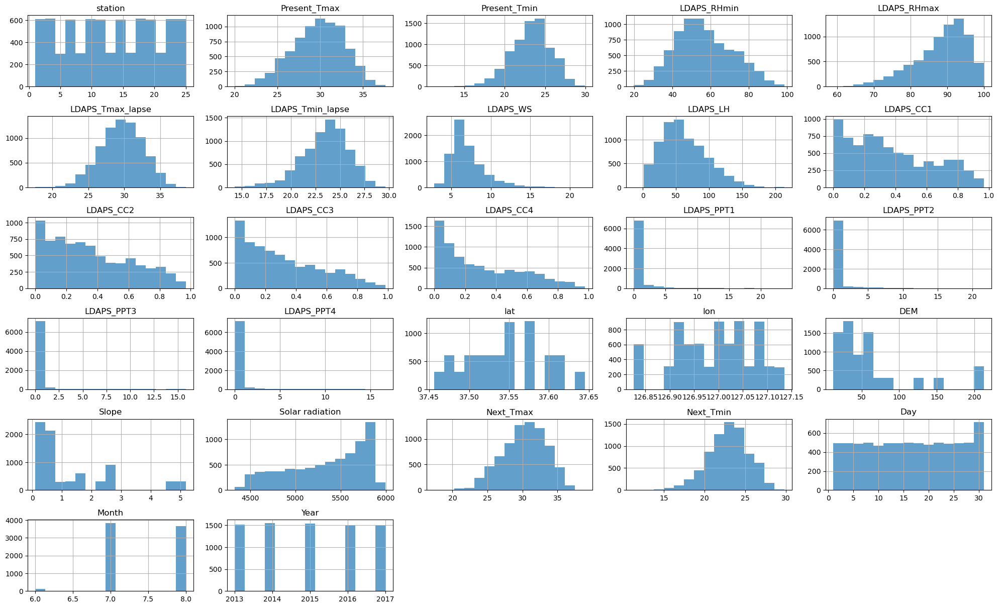

In [59]:
numeric_columns = df.select_dtypes(include=['float64','int32']).columns
df[numeric_columns].hist(bins=15, figsize=(20, 20), layout=(10, 5), alpha=0.7)
plt.tight_layout()
plt.show()

Here we can see the distribution of all the variables and clearly our target variable Next_Tmax and Next_Tmin shows the max temp varies between 27.5 to 33 and 20 to 26.5 for the minimum temperature. Here we can also see the distribution of other variables and how majority are rightly skewed such as wind speed, average latent heat flux, cloud cover and slopw whereas Rhmax & solar radiation are left skewed.


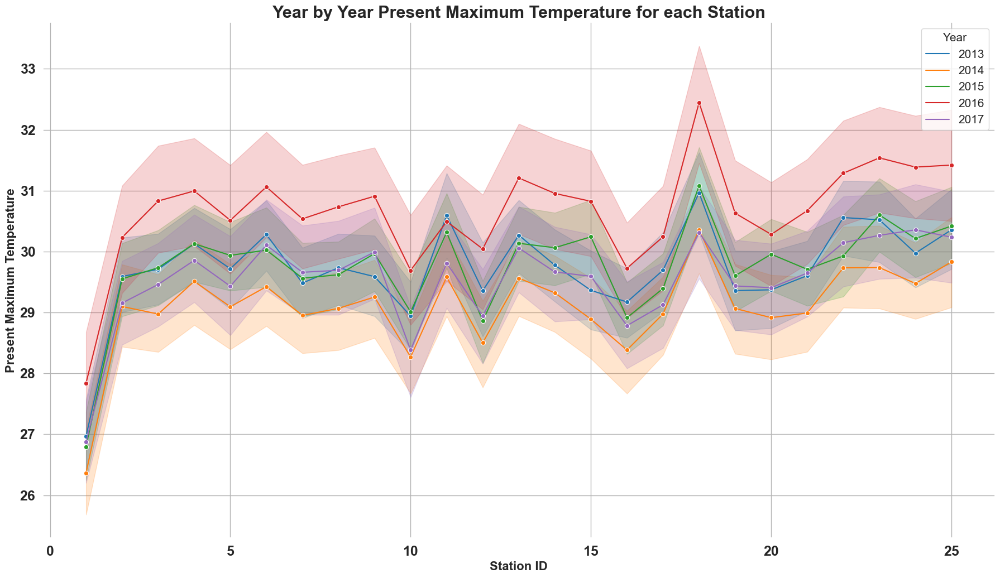

In [60]:
sns.set(rc={'figure.figsize':(22,12), 'axes.facecolor':'white', 'grid.color': '.7', 'grid.linestyle': '-'})
lineplot = sns.lineplot(x='station', y='Present_Tmax', data=df, hue='Year', marker='o', palette='tab10')
lineplot.set_title('Year by Year Present Maximum Temperature for each Station', fontsize=22, fontweight='bold')
lineplot.set_xlabel('Station ID', fontsize=16, fontweight='bold')
lineplot.set_ylabel('Present Maximum Temperature', fontsize=16, fontweight='heavy')
plt.setp(lineplot.get_xticklabels(), fontsize=18, fontweight='bold')
plt.setp(lineplot.get_yticklabels(), fontsize=18, fontweight='bold')
plt.legend(title='Year', title_fontsize='15', fontsize='15')
plt.show()


#Here we can see that station 1 had the lowest max tem and station 18 had the highest. We can also see that the highest temperature occured in 2016

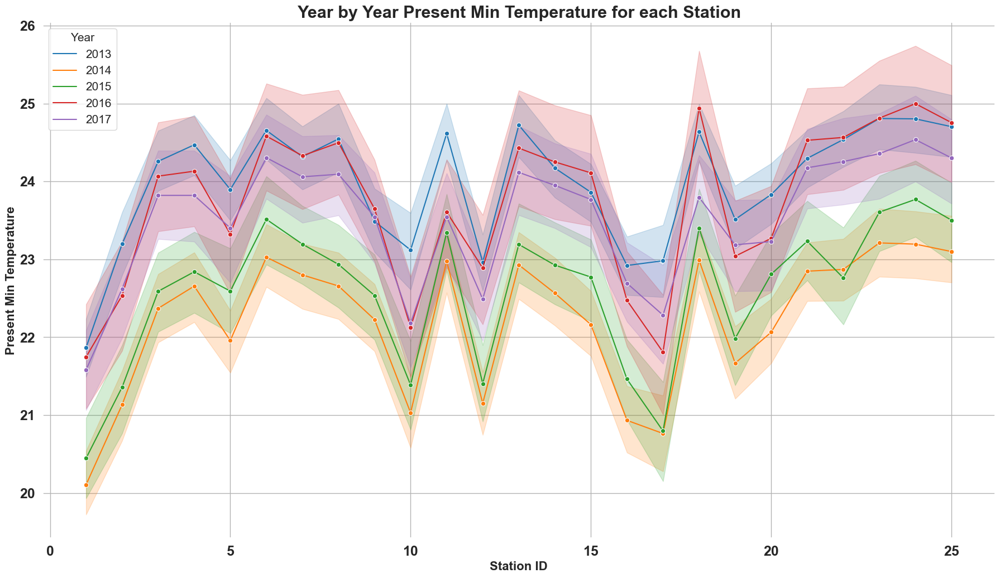

In [61]:
sns.set(rc={'figure.figsize':(22,12), 'axes.facecolor':'white', 'grid.color': '.7', 'grid.linestyle': '-'})
lineplot = sns.lineplot(x='station', y='Present_Tmin', data=df, hue='Year', marker='o', palette='tab10')
lineplot.set_title('Year by Year Present Min Temperature for each Station', fontsize=22, fontweight='bold')
lineplot.set_xlabel('Station ID', fontsize=16, fontweight='bold')
lineplot.set_ylabel('Present Min Temperature', fontsize=16, fontweight='heavy')
plt.setp(lineplot.get_xticklabels(), fontsize=18, fontweight='bold')
plt.setp(lineplot.get_yticklabels(), fontsize=18, fontweight='bold')
plt.legend(title='Year', title_fontsize='15', fontsize='15')
plt.show()

In [62]:
#Here we can see that the lowest or the coolest year was 2016 wherein station 1 had the lowest temperature 

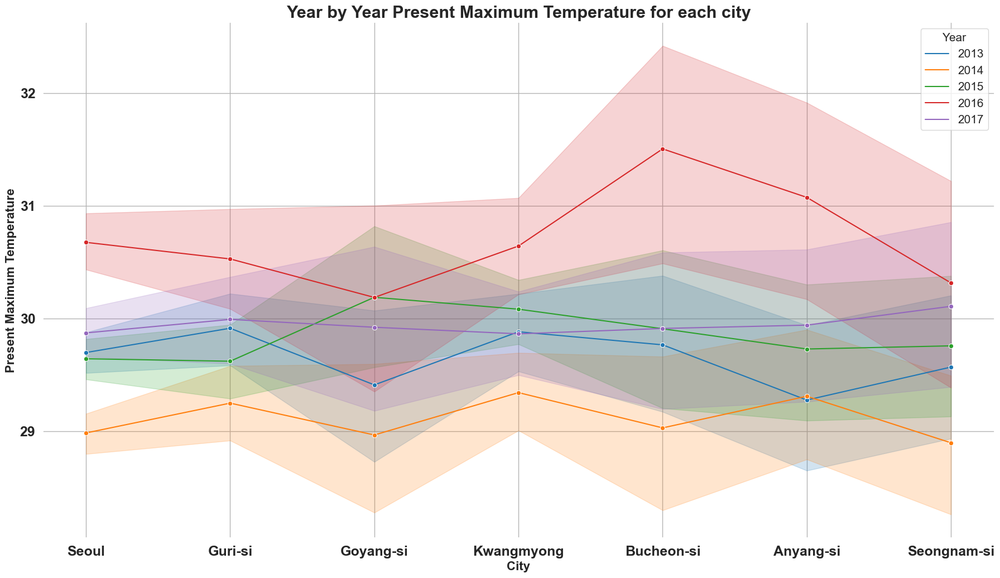

In [63]:
sns.set(rc={'figure.figsize':(22,12), 'axes.facecolor':'white', 'grid.color': '.7', 'grid.linestyle': '-'})
lineplot = sns.lineplot(x='City', y='Present_Tmax', data=df, hue='Year', marker='o', palette='tab10')
lineplot.set_title('Year by Year Present Maximum Temperature for each city', fontsize=22, fontweight='bold')
lineplot.set_xlabel('City', fontsize=16, fontweight='bold')
lineplot.set_ylabel('Present Maximum Temperature', fontsize=16, fontweight='heavy')
plt.setp(lineplot.get_xticklabels(), fontsize=18, fontweight='bold')
plt.setp(lineplot.get_yticklabels(), fontsize=18, fontweight='bold')
plt.legend(title='Year', title_fontsize='15', fontsize='15')
plt.show()

Bucheon-si experienced the highest temperature in 2016

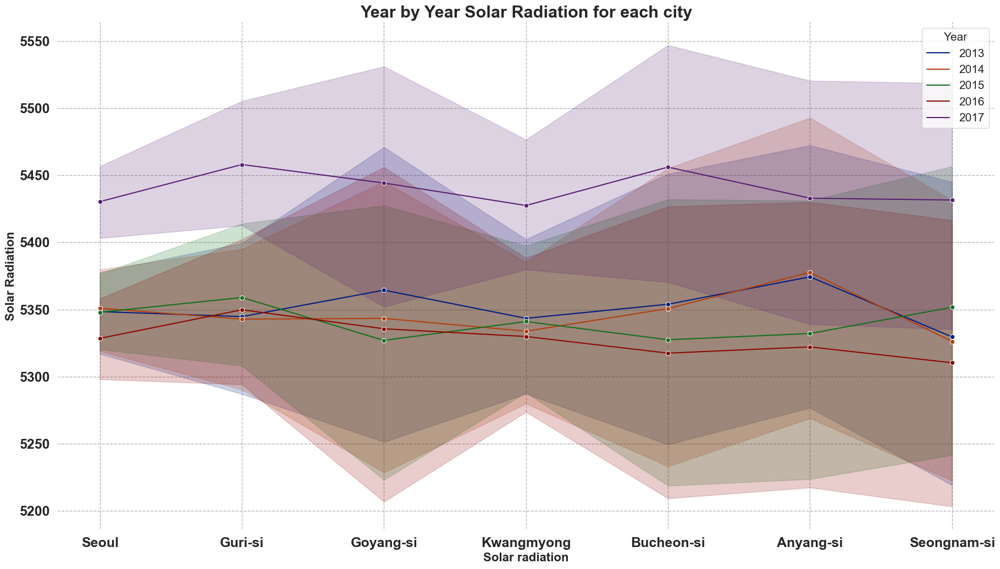

In [64]:
sns.set(rc={'figure.figsize':(22,12), 'axes.facecolor':'white', 'grid.color': '.7', 'grid.linestyle': '--'})
lineplot = sns.lineplot(x='City', y='Solar radiation', data=df, hue='Year', marker='o', palette='dark')
lineplot.set_title('Year by Year Solar Radiation for each city', fontsize=22, fontweight='bold')
lineplot.set_xlabel('Solar radiation', fontsize=16, fontweight='bold')
lineplot.set_ylabel('Solar Radiation', fontsize=16, fontweight='heavy')
plt.setp(lineplot.get_xticklabels(), fontsize=18, fontweight='bold')
plt.setp(lineplot.get_yticklabels(), fontsize=18, fontweight='bold')
plt.legend(title='Year', title_fontsize='15', fontsize='15')
plt.show()

#As we can see - solar radiation was quite low in 2016 which was the year wherein the temperatures were quite high. So it is quite counterintuitive that lower solar radiationsis contributing to higher temperature. However, there might be other factors which are playing a role towards higher temperature. 

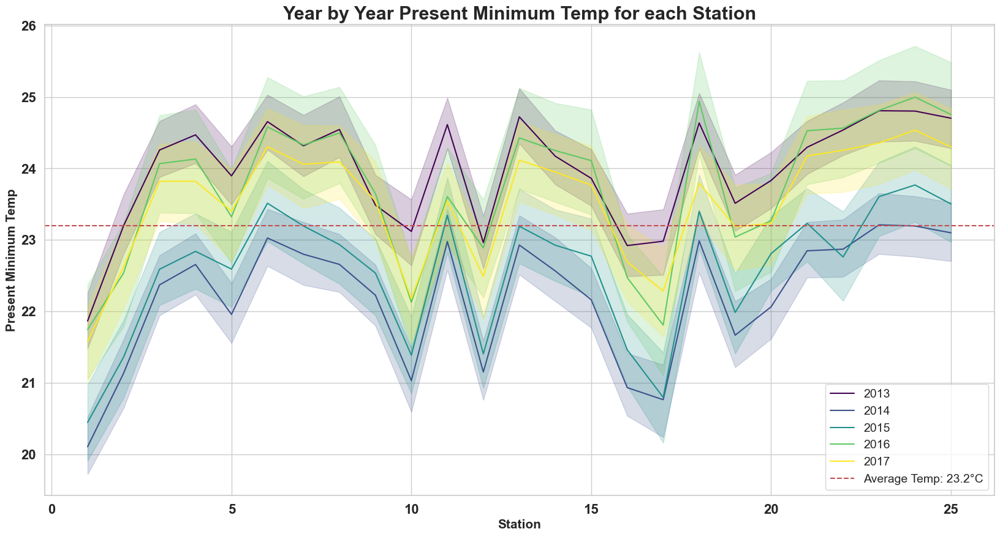

In [65]:
avg_temp = df['Present_Tmin'].mean()
sns.set(style='whitegrid', rc={'figure.figsize':(20,10), 'axes.labelweight':'bold', 'axes.titleweight':'bold'})
sns.lineplot(x='station', y='Present_Tmin', data=df, hue='Year', palette='viridis')
plt.axhline(y=avg_temp, color='r', linestyle='--', label=f'Average Temp: {avg_temp:.1f}°C')
plt.title('Year by Year Present Minimum Temp for each Station', fontsize=22)
plt.xlabel('Station', fontsize=15)
plt.ylabel('Present Minimum Temp', fontsize=15)
plt.xticks(fontsize=16, fontweight='bold')
plt.yticks(fontsize=16, fontweight='bold')
plt.legend(fontsize=14)
plt.show()

In [66]:
#As we can see the lowest temperature was in 2014 

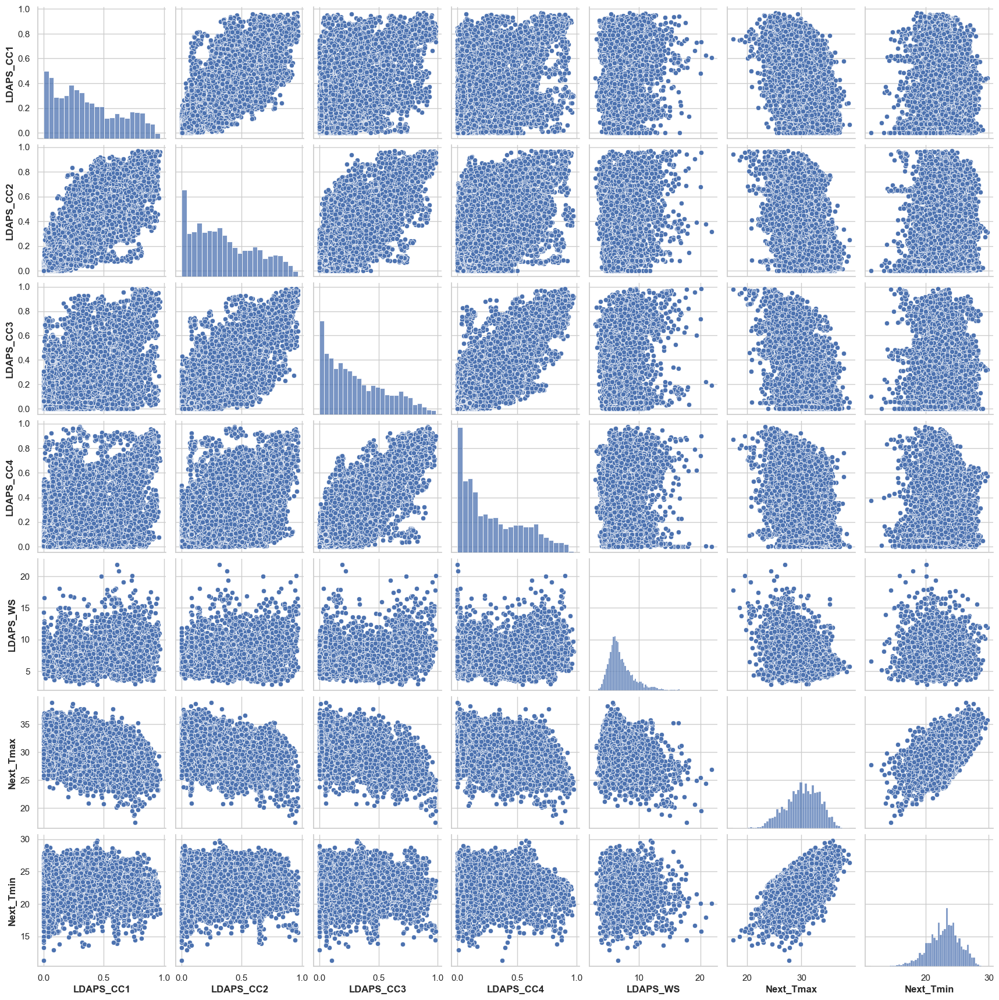

In [67]:
subset_df = df[['LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_WS', 'Next_Tmax', 'Next_Tmin']]
sns.pairplot(subset_df)
plt.show()

In [68]:
#So far, we are unable to see any relationship between cloud cover and next day's temperature but we will run further correlation test to confirm

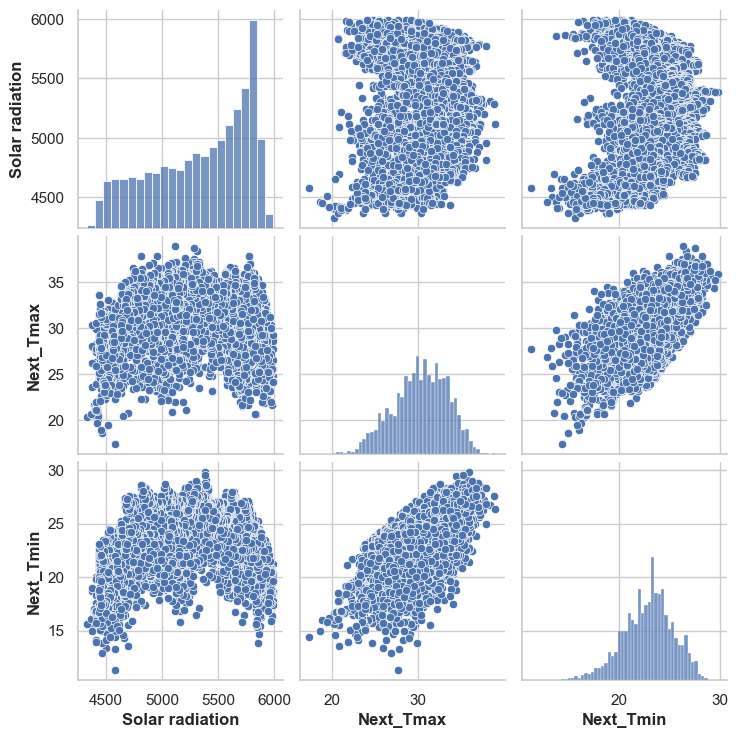

In [69]:
subset_df1 = df[['Solar radiation', 'Next_Tmax', 'Next_Tmin']]
sns.pairplot(subset_df1)
plt.show()

In [70]:
#Here it could be that solar radiation somehow shares a slight positive relationship with next minimum temperature but we will again confirm this

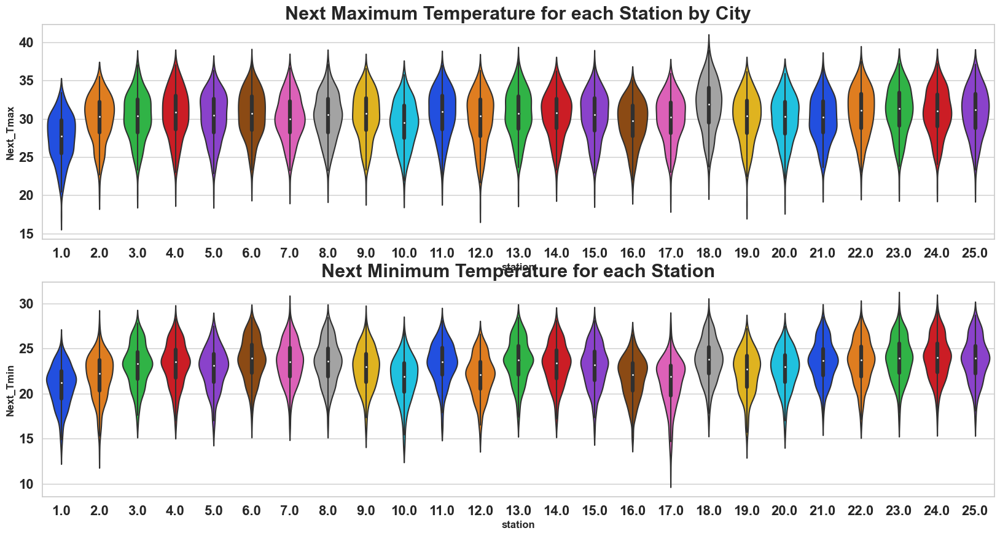

In [71]:
plt.subplot(2, 1, 1)
sns.violinplot(x='station', y='Next_Tmax', data=df, palette="bright")
plt.title('Next Maximum Temperature for each Station by City', fontsize=22)
plt.xticks(fontsize=16, fontweight='bold')
plt.yticks(fontsize=16, fontweight='bold')
#Checking next min temp for each station
plt.subplot(2,1,2)
sns.violinplot(x='station', y='Next_Tmin', data=df, palette="bright",)
plt.title('Next Minimum Temperature for each Station', fontsize=22)
plt.xticks(fontsize=16, fontweight='bold')
plt.yticks(fontsize=16, fontweight='bold')
plt.show()

In [72]:
#Station 18 with highest median and station 17 with the lowest

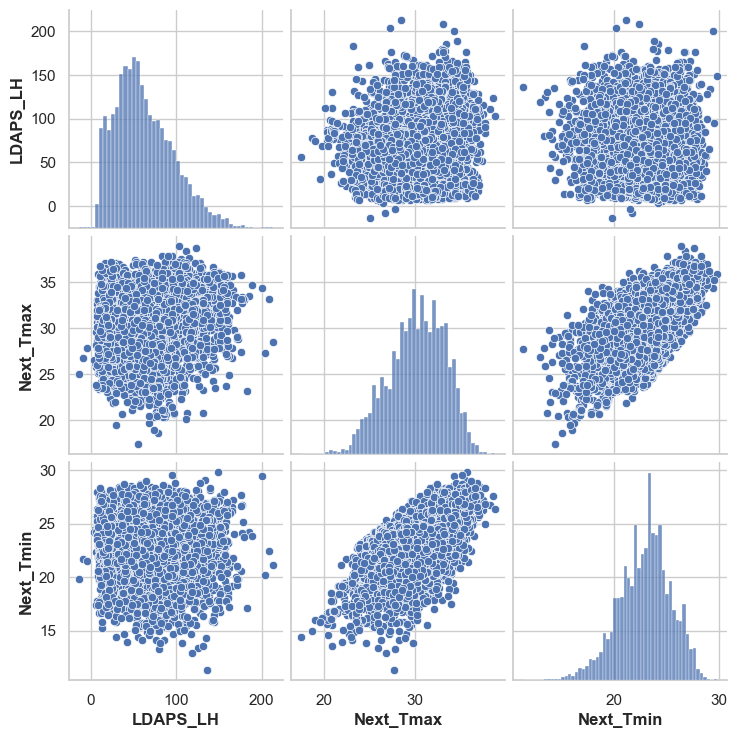

In [73]:
subset_df3 = df[['LDAPS_LH', 'Next_Tmax', 'Next_Tmin']]
sns.pairplot(subset_df3)
plt.show()

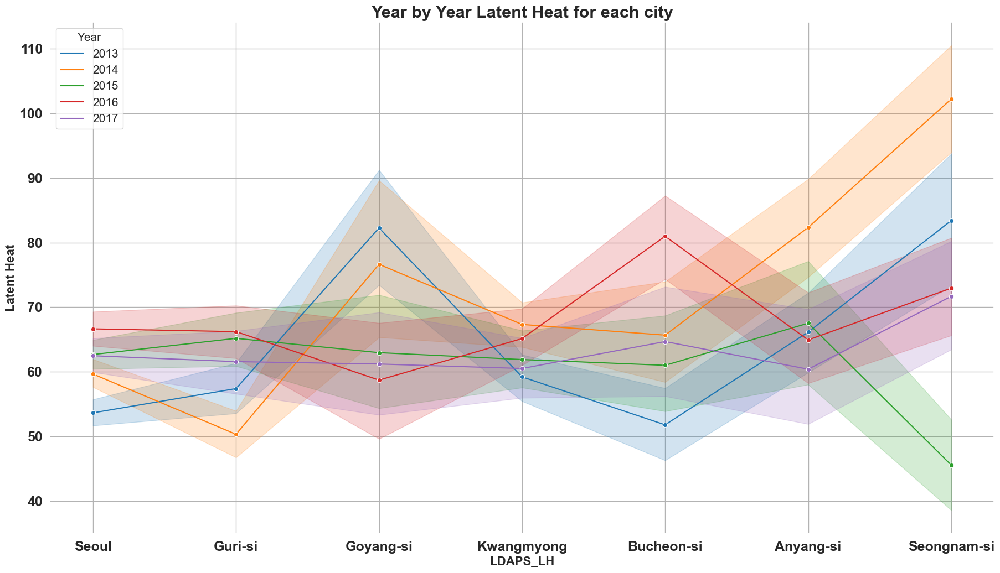

In [74]:
sns.set(rc={'figure.figsize':(22,12), 'axes.facecolor':'white', 'grid.color': '.7', 'grid.linestyle': '-'})
lineplot = sns.lineplot(x='City', y='LDAPS_LH', data=df, hue='Year', marker='o', palette='tab10')
lineplot.set_title('Year by Year Latent Heat for each city', fontsize=22, fontweight='bold')
lineplot.set_xlabel('LDAPS_LH', fontsize=16, fontweight='bold')
lineplot.set_ylabel('Latent Heat', fontsize=16, fontweight='heavy')
plt.setp(lineplot.get_xticklabels(), fontsize=18, fontweight='bold')
plt.setp(lineplot.get_yticklabels(), fontsize=18, fontweight='bold')
plt.legend(title='Year', title_fontsize='15', fontsize='15')
plt.show()

#We can see fluctuation in Latent Heat flow for example, how high it used to be in 2013 for Goyang-si and now it is decreasing year by year. The lowest was in 2015 and the highest was in 2014. Now, 2014 was the coolest year, however, as we can see the latent flow is quite high 2014

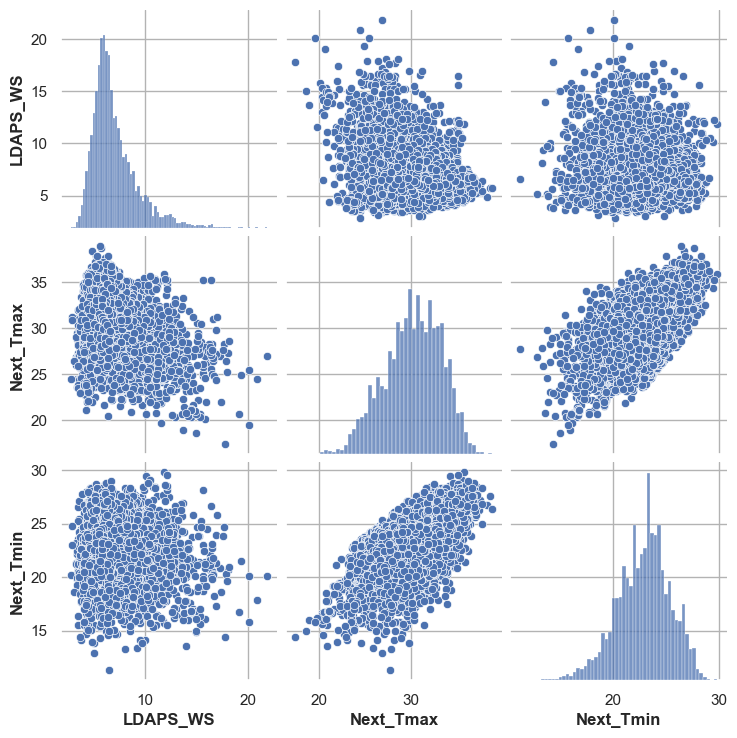

In [75]:
subset_df3 = df[['LDAPS_WS', 'Next_Tmax', 'Next_Tmin']]
sns.pairplot(subset_df3)
plt.show()

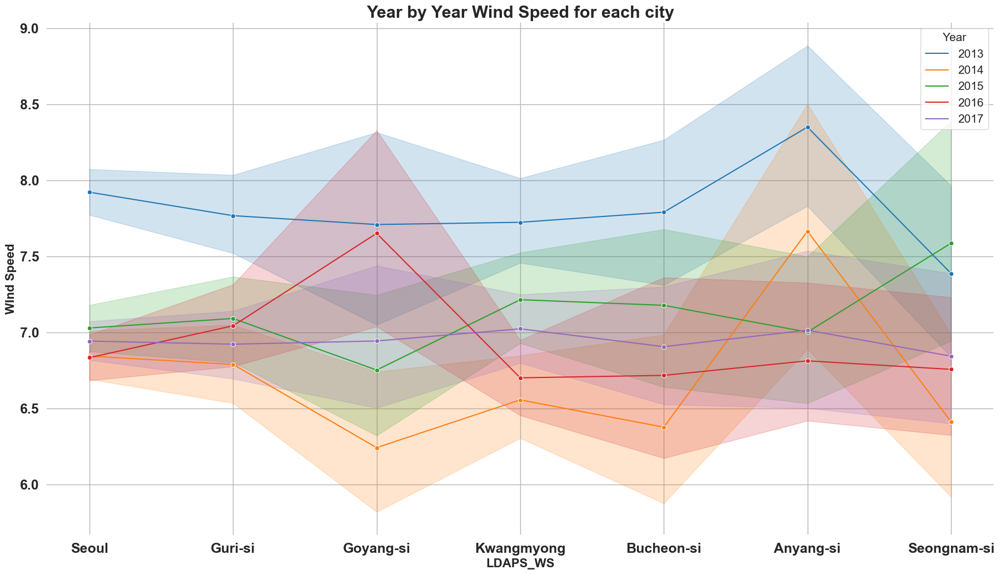

In [76]:
sns.set(rc={'figure.figsize':(22,12), 'axes.facecolor':'white', 'grid.color': '.7', 'grid.linestyle': '-'})
lineplot = sns.lineplot(x='City', y='LDAPS_WS', data=df, hue='Year', marker='o', palette='tab10')
lineplot.set_title('Year by Year Wind Speed for each city', fontsize=22, fontweight='bold')
lineplot.set_xlabel('LDAPS_WS', fontsize=16, fontweight='bold')
lineplot.set_ylabel('WInd Speed', fontsize=16, fontweight='heavy')
plt.setp(lineplot.get_xticklabels(), fontsize=18, fontweight='bold')
plt.setp(lineplot.get_yticklabels(), fontsize=18, fontweight='bold')
plt.legend(title='Year', title_fontsize='15', fontsize='15')
plt.show()

In [77]:
#For 2017, wind speed turns to more stable compare 2016 wherein we can see major fluctuation. The highest wind speed was in Anyang in 2013

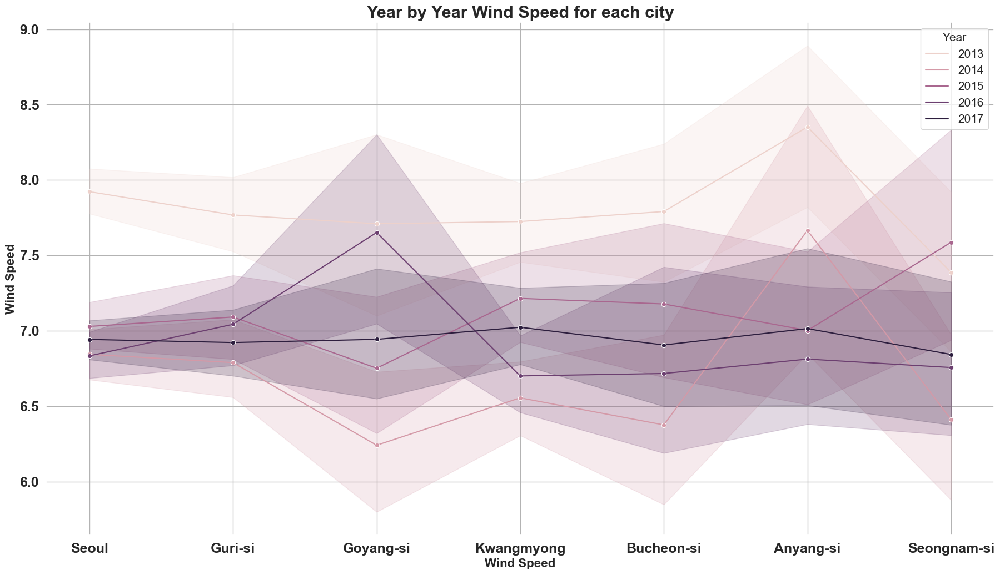

In [78]:
sns.set(rc={'figure.figsize':(22,12), 'axes.facecolor':'white', 'grid.color': '.7', 'grid.linestyle': '-'})
lineplot = sns.lineplot(x='City', y='LDAPS_WS', data=df, hue='Year', marker='o')
lineplot.set_title('Year by Year Wind Speed for each city', fontsize=22, fontweight='bold')
lineplot.set_xlabel('Wind Speed', fontsize=16, fontweight='bold')
lineplot.set_ylabel('Wind Speed', fontsize=16, fontweight='heavy')
plt.setp(lineplot.get_xticklabels(), fontsize=18, fontweight='bold')
plt.setp(lineplot.get_yticklabels(), fontsize=18, fontweight='bold')
plt.legend(title='Year', title_fontsize='15', fontsize='15')
plt.show()

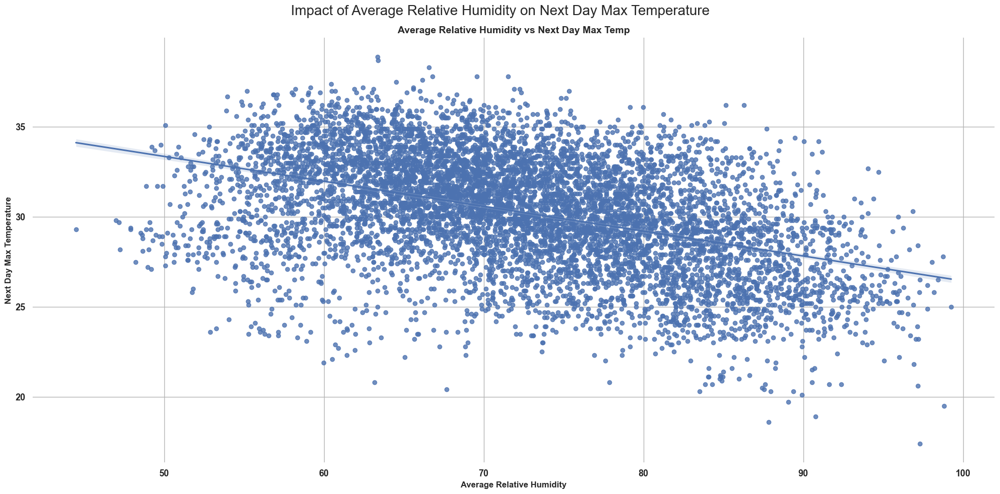

In [79]:
#Checking the relationship of humidity with next min/max temperature
df['Average_RH'] = df[['LDAPS_RHmin', 'LDAPS_RHmax']].mean(axis=1)
plt.figure(figsize=(20, 10))
plt.suptitle('Impact of Average Relative Humidity on Next Day Max Temperature', fontsize=20, fontweight='light')
plt.title('Average Relative Humidity vs Next Day Max Temp', fontsize=14, fontweight='bold')
sns.regplot(x='Average_RH', y='Next_Tmax', data=df)
plt.xlabel('Average Relative Humidity', fontsize=12, fontweight='bold')
plt.ylabel('Next Day Max Temperature', fontsize=12, fontweight='bold')
plt.xticks(fontsize=13, fontweight='bold')
plt.yticks(fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

In [80]:
#This shows a slight negative trend which is again unlikely but it could be due to cloud cover or rain which is contributing to this

<function matplotlib.pyplot.show(close=None, block=None)>

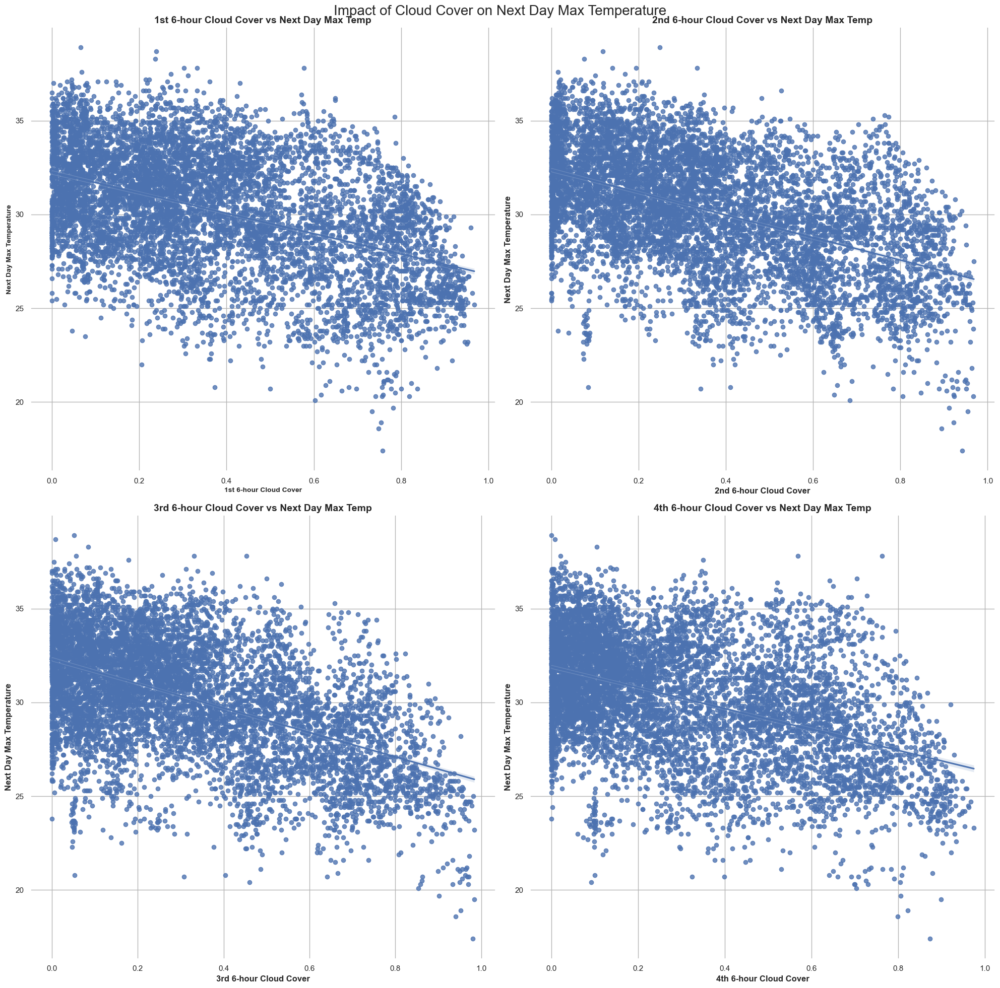

In [81]:
plt.figure(figsize=(20, 20))
plt.suptitle('Impact of Cloud Cover on Next Day Max Temperature', fontsize=20, fontweight='light')

#  1st 6-hour period
plt.subplot(2, 2, 1)
sns.regplot(x='LDAPS_CC1', y='Next_Tmax', data=df)
plt.title('1st 6-hour Cloud Cover vs Next Day Max Temp', fontsize=14, fontweight='bold')
plt.xlabel('1st 6-hour Cloud Cover', fontsize=10, fontweight='bold')
plt.ylabel('Next Day Max Temperature', fontsize=10, fontweight='bold')

# 2nd 6-hour period
plt.subplot(2, 2, 2)
sns.regplot(x='LDAPS_CC2', y='Next_Tmax', data=df)
plt.title('2nd 6-hour Cloud Cover vs Next Day Max Temp', fontsize=14, fontweight='bold')
plt.xlabel('2nd 6-hour Cloud Cover', fontsize=12, fontweight='bold')
plt.ylabel('Next Day Max Temperature', fontsize=12, fontweight='bold')

# 3rd 6-hour period
plt.subplot(2, 2, 3)
sns.regplot(x='LDAPS_CC3', y='Next_Tmax', data=df)
plt.title('3rd 6-hour Cloud Cover vs Next Day Max Temp', fontsize=14, fontweight='bold')
plt.xlabel('3rd 6-hour Cloud Cover', fontsize=12, fontweight='bold')
plt.ylabel('Next Day Max Temperature', fontsize=12, fontweight='bold')

# 4th 6-hour period
plt.subplot(2, 2, 4)
sns.regplot(x='LDAPS_CC4', y='Next_Tmax', data=df)
plt.title('4th 6-hour Cloud Cover vs Next Day Max Temp', fontsize=14, fontweight='bold')
plt.xlabel('4th 6-hour Cloud Cover', fontsize=12, fontweight='bold')
plt.ylabel('Next Day Max Temperature', fontsize=12, fontweight='bold')
           
plt.tight_layout()
plt.show


<function matplotlib.pyplot.show(close=None, block=None)>

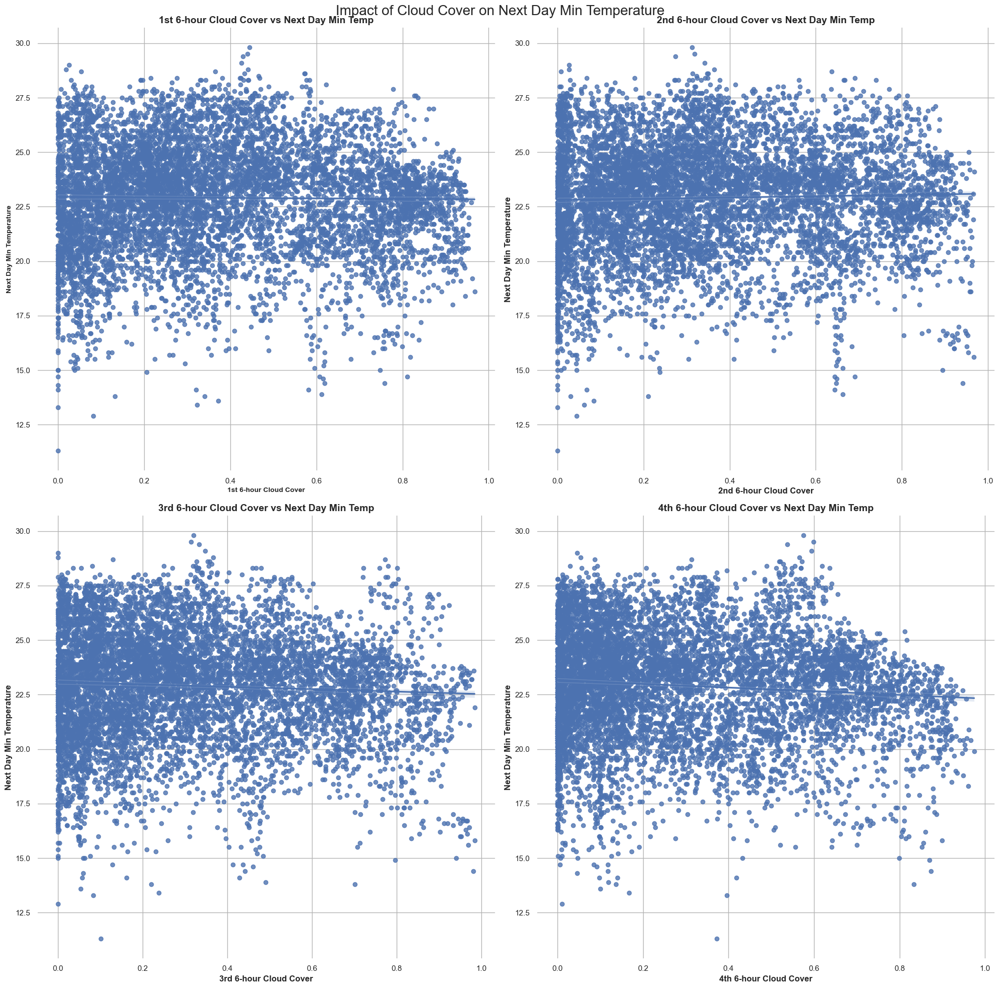

In [82]:
plt.figure(figsize=(20, 20))
plt.suptitle('Impact of Cloud Cover on Next Day Min Temperature', fontsize=20, fontweight='light')

#  1st 6-hour period
plt.subplot(2, 2, 1)
sns.regplot(x='LDAPS_CC1', y='Next_Tmin', data=df)
plt.title('1st 6-hour Cloud Cover vs Next Day Min Temp', fontsize=14, fontweight='bold')
plt.xlabel('1st 6-hour Cloud Cover', fontsize=10, fontweight='bold')
plt.ylabel('Next Day Min Temperature', fontsize=10, fontweight='bold')

# 2nd 6-hour period
plt.subplot(2, 2, 2)
sns.regplot(x='LDAPS_CC2', y='Next_Tmin', data=df)
plt.title('2nd 6-hour Cloud Cover vs Next Day Min Temp', fontsize=14, fontweight='bold')
plt.xlabel('2nd 6-hour Cloud Cover', fontsize=12, fontweight='bold')
plt.ylabel('Next Day Min Temperature', fontsize=12, fontweight='bold')

# 3rd 6-hour period
plt.subplot(2, 2, 3)
sns.regplot(x='LDAPS_CC3', y='Next_Tmin', data=df)
plt.title('3rd 6-hour Cloud Cover vs Next Day Min Temp', fontsize=14, fontweight='bold')
plt.xlabel('3rd 6-hour Cloud Cover', fontsize=12, fontweight='bold')
plt.ylabel('Next Day Min Temperature', fontsize=12, fontweight='bold')

# 4th 6-hour period
plt.subplot(2, 2, 4)
sns.regplot(x='LDAPS_CC4', y='Next_Tmin', data=df)
plt.title('4th 6-hour Cloud Cover vs Next Day Min Temp', fontsize=14, fontweight='bold')
plt.xlabel('4th 6-hour Cloud Cover', fontsize=12, fontweight='bold')
plt.ylabel('Next Day Min Temperature', fontsize=12, fontweight='bold')
           
plt.tight_layout()
plt.show

In [83]:
#Here we can see that there is a negative relationship with cloud cover and next day temperature (max)

In [84]:
#We can also see that there is almost no relation for the first 12 hours and then a slight negative relationship between cloud cover and minimun temperature. 

<function matplotlib.pyplot.show(close=None, block=None)>

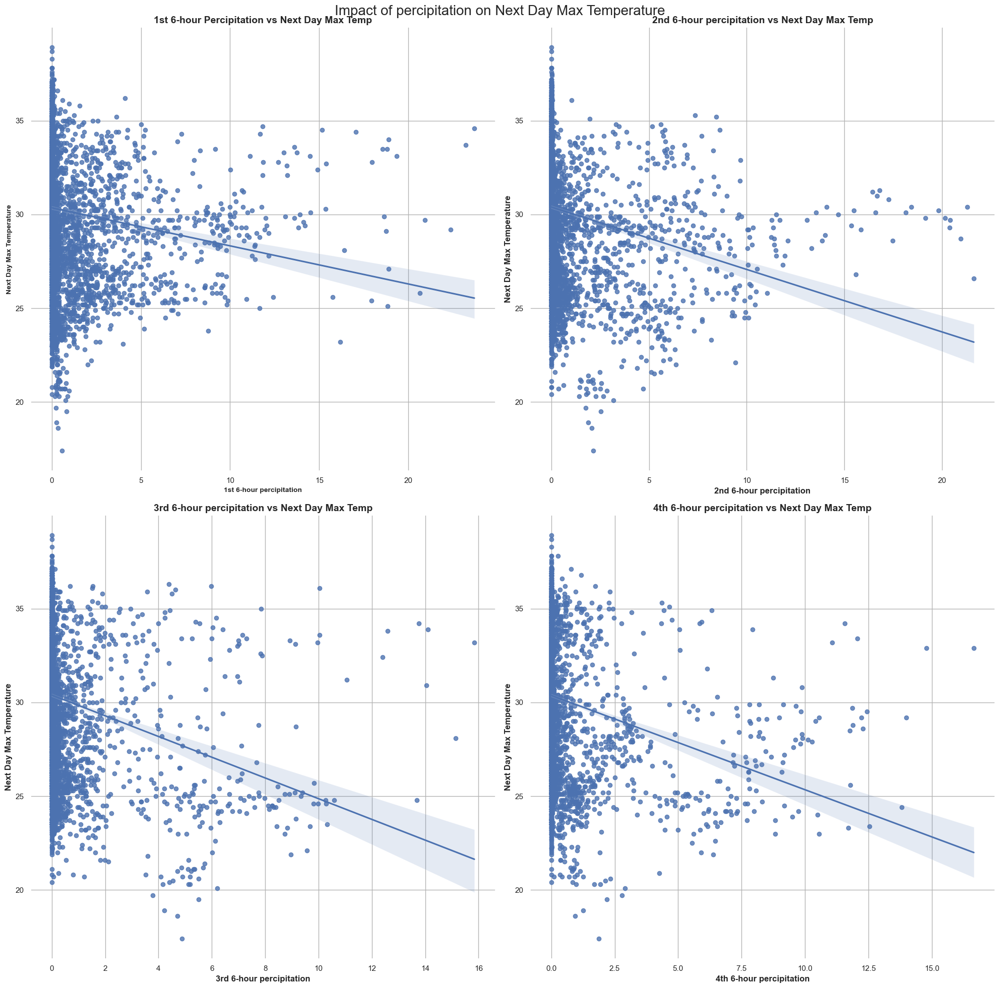

In [85]:
plt.figure(figsize=(20, 20))
plt.suptitle('Impact of percipitation on Next Day Max Temperature', fontsize=20, fontweight='light')

#  1st 6-hour period
plt.subplot(2, 2, 1)
sns.regplot(x='LDAPS_PPT1', y='Next_Tmax', data=df)
plt.title('1st 6-hour Percipitation vs Next Day Max Temp', fontsize=14, fontweight='bold')
plt.xlabel('1st 6-hour percipitation', fontsize=10, fontweight='bold')
plt.ylabel('Next Day Max Temperature', fontsize=10, fontweight='bold')

# 2nd 6-hour period
plt.subplot(2, 2, 2)
sns.regplot(x='LDAPS_PPT2', y='Next_Tmax', data=df)
plt.title('2nd 6-hour percipitation vs Next Day Max Temp', fontsize=14, fontweight='bold')
plt.xlabel('2nd 6-hour percipitation', fontsize=12, fontweight='bold')
plt.ylabel('Next Day Max Temperature', fontsize=12, fontweight='bold')

# 3rd 6-hour period
plt.subplot(2, 2, 3)
sns.regplot(x='LDAPS_PPT3', y='Next_Tmax', data=df)
plt.title('3rd 6-hour percipitation vs Next Day Max Temp', fontsize=14, fontweight='bold')
plt.xlabel('3rd 6-hour percipitation', fontsize=12, fontweight='bold')
plt.ylabel('Next Day Max Temperature', fontsize=12, fontweight='bold')

#  4th 6-hour period
plt.subplot(2, 2, 4)
sns.regplot(x='LDAPS_PPT4', y='Next_Tmax', data=df)
plt.title('4th 6-hour percipitation vs Next Day Max Temp', fontsize=14, fontweight='bold')
plt.xlabel('4th 6-hour percipitation', fontsize=12, fontweight='bold')
plt.ylabel('Next Day Max Temperature', fontsize=12, fontweight='bold')
           
plt.tight_layout()
plt.show

<function matplotlib.pyplot.show(close=None, block=None)>

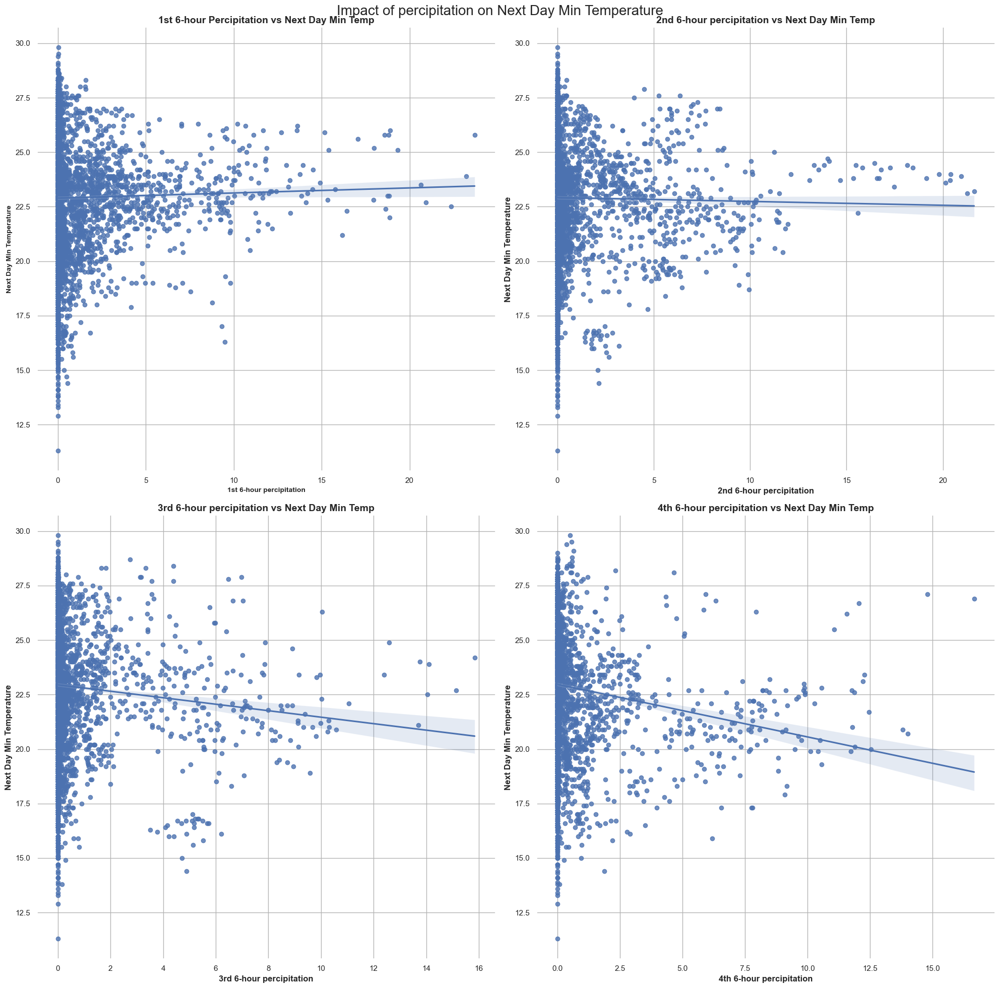

In [86]:
plt.figure(figsize=(20, 20))
plt.suptitle('Impact of percipitation on Next Day Min Temperature', fontsize=20, fontweight='light')

#  1st 6-hour period
plt.subplot(2, 2, 1)
sns.regplot(x='LDAPS_PPT1', y='Next_Tmin', data=df)
plt.title('1st 6-hour Percipitation vs Next Day Min Temp', fontsize=14, fontweight='bold')
plt.xlabel('1st 6-hour percipitation', fontsize=10, fontweight='bold')
plt.ylabel('Next Day Min Temperature', fontsize=10, fontweight='bold')

# 2nd 6-hour period
plt.subplot(2, 2, 2)
sns.regplot(x='LDAPS_PPT2', y='Next_Tmin', data=df)
plt.title('2nd 6-hour percipitation vs Next Day Min Temp', fontsize=14, fontweight='bold')
plt.xlabel('2nd 6-hour percipitation', fontsize=12, fontweight='bold')
plt.ylabel('Next Day Min Temperature', fontsize=12, fontweight='bold')

# 3rd 6-hour period
plt.subplot(2, 2, 3)
sns.regplot(x='LDAPS_PPT3', y='Next_Tmin', data=df)
plt.title('3rd 6-hour percipitation vs Next Day Min Temp', fontsize=14, fontweight='bold')
plt.xlabel('3rd 6-hour percipitation', fontsize=12, fontweight='bold')
plt.ylabel('Next Day Min Temperature', fontsize=12, fontweight='bold')

#  4th 6-hour period
plt.subplot(2, 2, 4)
sns.regplot(x='LDAPS_PPT4', y='Next_Tmin', data=df)
plt.title('4th 6-hour percipitation vs Next Day Min Temp', fontsize=14, fontweight='bold')
plt.xlabel('4th 6-hour percipitation', fontsize=12, fontweight='bold')
plt.ylabel('Next Day Min Temperature', fontsize=12, fontweight='bold')
           
plt.tight_layout()
plt.show

In [87]:
#Cannot exactly see a precise relationship here 

<function matplotlib.pyplot.show(close=None, block=None)>

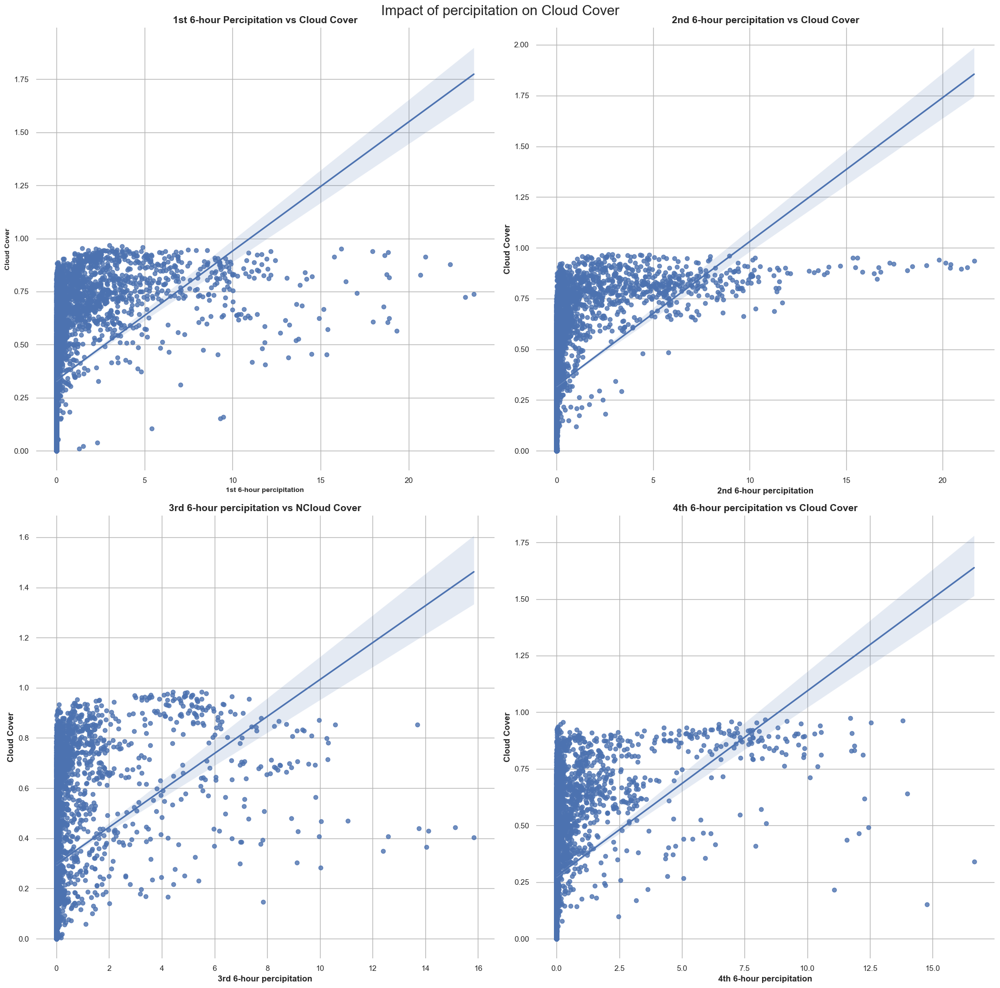

In [88]:
plt.figure(figsize=(20, 20))
plt.suptitle('Impact of percipitation on Cloud Cover', fontsize=20, fontweight='light')

#  1st 6-hour period
plt.subplot(2, 2, 1)
sns.regplot(x='LDAPS_PPT1', y='LDAPS_CC1', data=df)
plt.title('1st 6-hour Percipitation vs Cloud Cover', fontsize=14, fontweight='bold')
plt.xlabel('1st 6-hour percipitation', fontsize=10, fontweight='bold')
plt.ylabel('Cloud Cover', fontsize=10, fontweight='bold')

# 2nd 6-hour period
plt.subplot(2, 2, 2)
sns.regplot(x='LDAPS_PPT2', y='LDAPS_CC2', data=df)
plt.title('2nd 6-hour percipitation vs Cloud Cover', fontsize=14, fontweight='bold')
plt.xlabel('2nd 6-hour percipitation', fontsize=12, fontweight='bold')
plt.ylabel('Cloud Cover', fontsize=12, fontweight='bold')

# 3rd 6-hour period
plt.subplot(2, 2, 3)
sns.regplot(x='LDAPS_PPT3', y='LDAPS_CC3', data=df)
plt.title('3rd 6-hour percipitation vs NCloud Cover', fontsize=14, fontweight='bold')
plt.xlabel('3rd 6-hour percipitation', fontsize=12, fontweight='bold')
plt.ylabel('Cloud Cover', fontsize=12, fontweight='bold')

#  4th 6-hour period
plt.subplot(2, 2, 4)
sns.regplot(x='LDAPS_PPT4', y='LDAPS_CC4', data=df)
plt.title('4th 6-hour percipitation vs Cloud Cover', fontsize=14, fontweight='bold')
plt.xlabel('4th 6-hour percipitation', fontsize=12, fontweight='bold')
plt.ylabel('Cloud Cover', fontsize=12, fontweight='bold')
           
plt.tight_layout()
plt.show

In [89]:
#We can see a slight positive relationship with cloud cover and percipitation

Text(0, 0.5, 'Next Day Max Temperature')

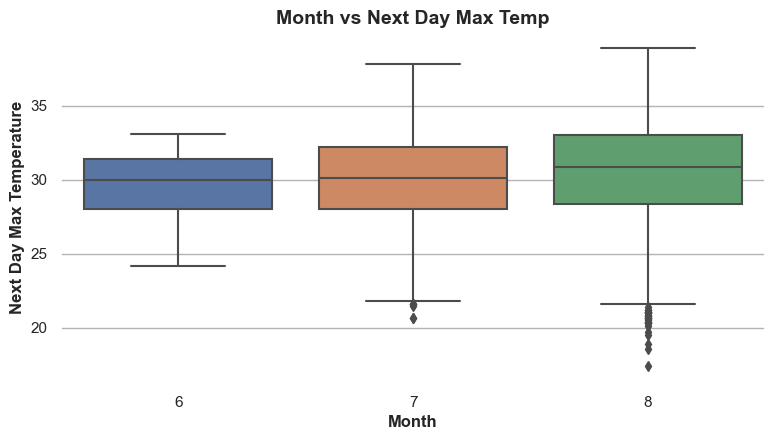

In [90]:
plt.figure(figsize=(20, 10))
plt.subplot(2, 2, 1)
sns.boxplot(x='Month', y='Next_Tmax', data=df)
plt.title('Month vs Next Day Max Temp', fontsize=14, fontweight='bold')
plt.xlabel('Month', fontsize=12, fontweight='bold')
plt.ylabel('Next Day Max Temperature', fontsize=12, fontweight='bold')

In [91]:
#This shows a warming trend

Text(0, 0.5, 'Next Day Max Temperature')

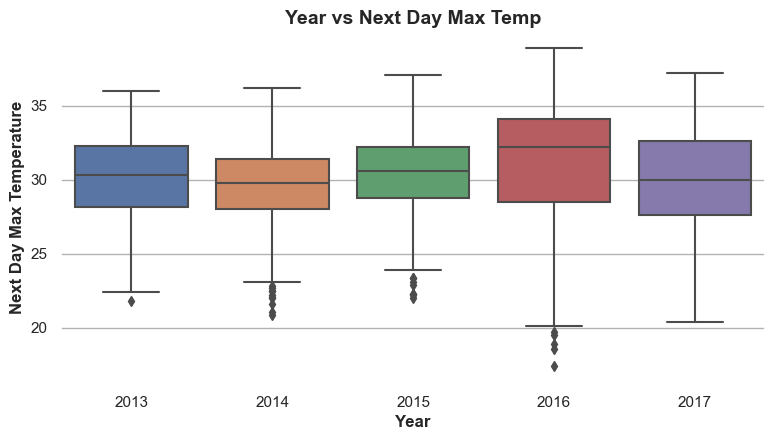

In [92]:
plt.figure(figsize=(20, 10))
plt.subplot(2, 2, 1)
sns.boxplot(x='Year', y='Next_Tmax', data=df)
plt.title('Year vs Next Day Max Temp', fontsize=14, fontweight='bold')
plt.xlabel('Year', fontsize=12, fontweight='bold')
plt.ylabel('Next Day Max Temperature', fontsize=12, fontweight='bold')

In [93]:
#we can see that since 2014 to 2016 temperatures have been increasing showing a warm trend

In [94]:
df.columns

Index(['station', 'Date', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin',
       'LDAPS_RHmax', 'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS',
       'LDAPS_LH', 'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4',
       'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon',
       'DEM', 'Slope', 'Solar radiation', 'Next_Tmax', 'Next_Tmin', 'Day',
       'Month', 'Year', 'City', 'Average_RH'],
      dtype='object')

In [95]:
df.drop(["Average_RH"], axis=1, inplace=True)

In [96]:
df.drop(["Date"], axis=1, inplace=True)

In [97]:
df.columns

Index(['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
       'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
       'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon', 'DEM', 'Slope',
       'Solar radiation', 'Next_Tmax', 'Next_Tmin', 'Day', 'Month', 'Year',
       'City'],
      dtype='object')

In [98]:
#We can now start with encoding

In [99]:
from sklearn.preprocessing import LabelEncoder

In [100]:
Cat=['City']
LE = LabelEncoder()
for c in Cat:
      df[c] = LE.fit_transform(df[c])

In [101]:
df.head(10)

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month,Year,City
0,1.0,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,0.233947,...,126.991,212.3350,2.7850,5992.895996,29.1,21.2,30,6,2013,6
1,2.0,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,0.225508,...,127.032,44.7624,0.5141,5869.312500,30.5,22.5,30,6,2013,6
2,3.0,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,0.209344,...,127.058,33.3068,0.2661,5863.555664,31.1,23.9,30,6,2013,6
3,4.0,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,0.216372,...,127.022,45.7160,2.5348,5856.964844,31.7,24.3,30,6,2013,6
4,5.0,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,0.151407,...,127.135,35.0380,0.5055,5859.552246,31.2,22.5,30,6,2013,3
5,6.0,31.9,23.5,52.437126,85.307251,29.219342,23.822613,6.182295,50.231389,0.185279,...,127.042,54.6384,0.1457,5873.780762,31.5,24.0,30,6,2013,6
6,7.0,31.4,24.4,56.287189,81.019760,28.551859,24.238467,5.587135,125.110007,0.389600,...,126.838,12.3700,0.0985,5849.233398,30.9,23.4,30,6,2013,2
7,8.0,32.1,23.6,52.326218,78.004539,28.851982,23.819054,6.104417,42.011547,0.357856,...,126.910,52.5180,1.5629,5863.992188,31.1,22.9,30,6,2013,4
8,9.0,31.4,22.0,55.338791,80.784607,28.426975,23.332373,6.017135,85.110971,0.408766,...,126.826,50.9312,0.4125,5876.901367,31.3,21.6,30,6,2013,1
9,10.0,31.6,20.5,56.651203,86.849632,27.576705,22.527018,6.518841,63.006075,0.348292,...,126.955,208.5070,5.1782,5893.608398,30.5,21.0,30,6,2013,0


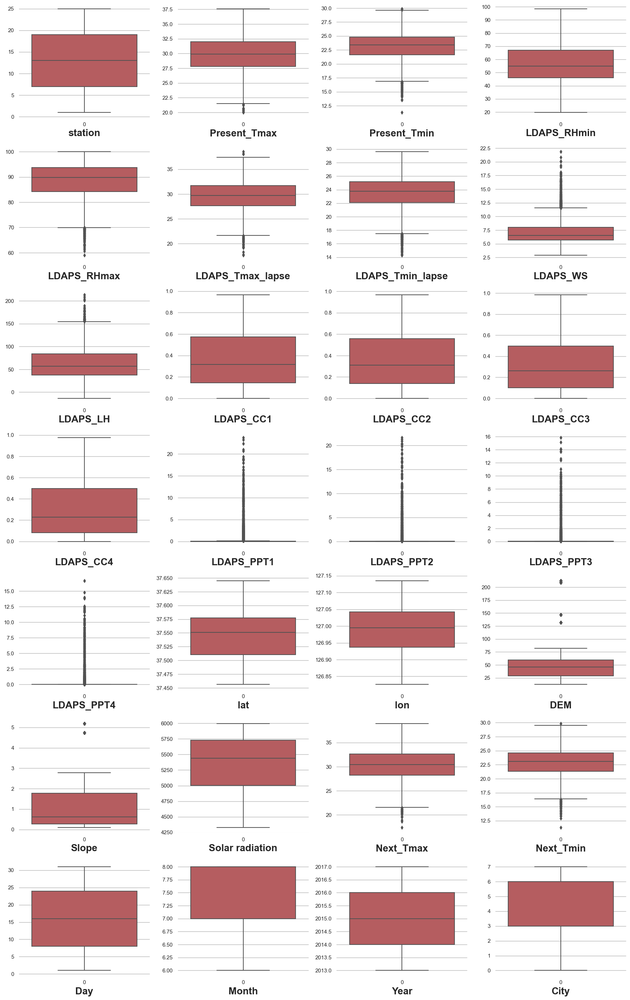

In [102]:
plt.figure(figsize=(18,40),facecolor='white')
PN=1
for c in df:
    if PN<=30:
        axis=plt.subplot(10,4,PN)
        sns.boxplot(df[c],color='r')
        plt.xlabel(c,fontsize=20)
        PN+=1
plt.tight_layout()
plt.show()

In [103]:
#We can see that there are quite a few variables with outliers. We will now remove them using z score

In [104]:
from scipy.stats import zscore

In [105]:
z=np.abs(zscore(df))

In [106]:
threshold = 3

In [107]:
dfnew=df[(z<3).all(axis=1)]

In [108]:
print("Shape of original dataframe:", df.shape)
print("New Shape:", dfnew.shape)
print("Overall Data Loss:",(df.shape[0]-dfnew.shape[0])/df.shape[0]*100)

Shape of original dataframe: (7588, 28)
New Shape: (6739, 28)
Overall Data Loss: 11.188719030047443


In [109]:
#Here we can see that the data loss is around 849 points or 11% which in this case should be okay since its a large dataset

In [110]:
dfnew.skew()

station            -0.001594
Present_Tmax       -0.269936
Present_Tmin       -0.221250
LDAPS_RHmin         0.309567
LDAPS_RHmax        -0.686083
LDAPS_Tmax_lapse   -0.110563
LDAPS_Tmin_lapse   -0.379269
LDAPS_WS            1.085685
LDAPS_LH            0.567050
LDAPS_CC1           0.594835
LDAPS_CC2           0.505774
LDAPS_CC3           0.701288
LDAPS_CC4           0.708754
LDAPS_PPT1          3.724580
LDAPS_PPT2          4.854967
LDAPS_PPT3          5.516862
LDAPS_PPT4          5.924324
lat                 0.106983
lon                -0.277547
DEM                 1.764698
Slope               1.590130
Solar radiation    -0.520157
Next_Tmax          -0.267526
Next_Tmin          -0.234328
Day                 0.000057
Month              -0.168571
Year                0.025066
City               -0.951530
dtype: float64

In [111]:
from sklearn.preprocessing import PowerTransformer

In [112]:
pt = PowerTransformer(method='yeo-johnson')
skewed_col = ['LDAPS_RHmin', 'LDAPS_RHmax', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH', 'LDAPS_CC1', 
                  'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1', 'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'DEM','Slope','Solar radiation','City']
dfnew[skewed_col] = pt.fit_transform(dfnew[skewed_col])
new = dfnew.skew()
print(new)

station            -0.001594
Present_Tmax       -0.269936
Present_Tmin       -0.221250
LDAPS_RHmin        -0.014095
LDAPS_RHmax        -0.103320
LDAPS_Tmax_lapse   -0.110563
LDAPS_Tmin_lapse   -0.027814
LDAPS_WS            0.007615
LDAPS_LH           -0.030736
LDAPS_CC1           0.065308
LDAPS_CC2           0.505774
LDAPS_CC3           0.094449
LDAPS_CC4           0.142061
LDAPS_PPT1          1.617538
LDAPS_PPT2          1.820237
LDAPS_PPT3          1.995359
LDAPS_PPT4          2.267954
lat                 0.106983
lon                -0.277547
DEM                 0.038830
Slope               0.233799
Solar radiation    -0.172156
Next_Tmax          -0.267526
Next_Tmin          -0.234328
Day                 0.000057
Month              -0.168571
Year                0.025066
City               -0.482316
dtype: float64


In [113]:
#I have tried to reduce the skewness but it is not decrease for percipitation at all

In [114]:
dfnew.corr()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin,Day,Month,Year,City
station,1.000000,0.110291,0.133638,-0.068894,-0.182354,0.066863,0.108664,0.030231,-0.135717,0.011902,...,-0.122829,-0.326019,-0.146034,-0.034787,0.106378,0.129110,0.005032,0.011380,0.006658,-0.161253
Present_Tmax,0.110291,1.000000,0.610428,-0.145118,-0.320074,0.540680,0.623443,-0.071596,0.119022,-0.286862,...,0.011132,-0.130892,-0.092409,-0.099696,0.586943,0.615950,-0.130708,0.169326,0.099185,-0.034591
Present_Tmin,0.133638,0.610428,1.000000,0.160851,-0.053421,0.441577,0.764041,0.034364,-0.008556,0.104457,...,-0.043201,-0.238916,-0.157839,-0.047145,0.438813,0.785946,-0.082712,0.106547,0.099222,-0.043390
LDAPS_RHmin,-0.068894,-0.145118,0.160851,1.000000,0.559957,-0.543298,0.127619,0.154888,0.013872,0.574759,...,-0.095655,0.058251,0.084022,0.225374,-0.416330,0.147791,-0.067637,-0.177530,0.001537,-0.065908
LDAPS_RHmax,-0.182354,-0.320074,-0.053421,0.559957,1.000000,-0.403634,-0.182113,0.060965,0.285942,0.415436,...,0.013059,0.174176,0.209222,0.154031,-0.323446,-0.110402,-0.014136,-0.131920,-0.146019,-0.033794
LDAPS_Tmax_lapse,0.066863,0.540680,0.441577,-0.543298,-0.403634,1.000000,0.624572,-0.154400,0.005878,-0.404350,...,0.106354,-0.110286,-0.105094,-0.034699,0.816861,0.553227,-0.139339,0.116760,0.066794,-0.011638
LDAPS_Tmin_lapse,0.108664,0.623443,0.764041,0.127619,-0.182113,0.624572,1.000000,-0.002164,-0.143246,0.061541,...,-0.025047,-0.174769,-0.160165,0.009890,0.550810,0.873678,-0.141873,0.085646,0.061339,-0.036757
LDAPS_WS,0.030231,-0.071596,0.034364,0.154888,0.060965,-0.154400,-0.002164,1.000000,-0.056362,0.189345,...,-0.077686,0.113157,0.095385,0.164626,-0.205979,0.023330,-0.058922,-0.128725,-0.119526,-0.014091
LDAPS_LH,-0.135717,0.119022,-0.008556,0.013872,0.285942,0.005878,-0.143246,-0.056362,1.000000,-0.130020,...,0.009790,0.053275,0.069892,-0.032027,0.151784,-0.052365,-0.021563,0.046641,0.054981,-0.035062
LDAPS_CC1,0.011902,-0.286862,0.104457,0.574759,0.415436,-0.404350,0.061541,0.189345,-0.130020,1.000000,...,-0.016127,-0.031579,-0.034505,0.224341,-0.430392,0.043682,-0.052515,-0.204988,-0.066940,-0.028855


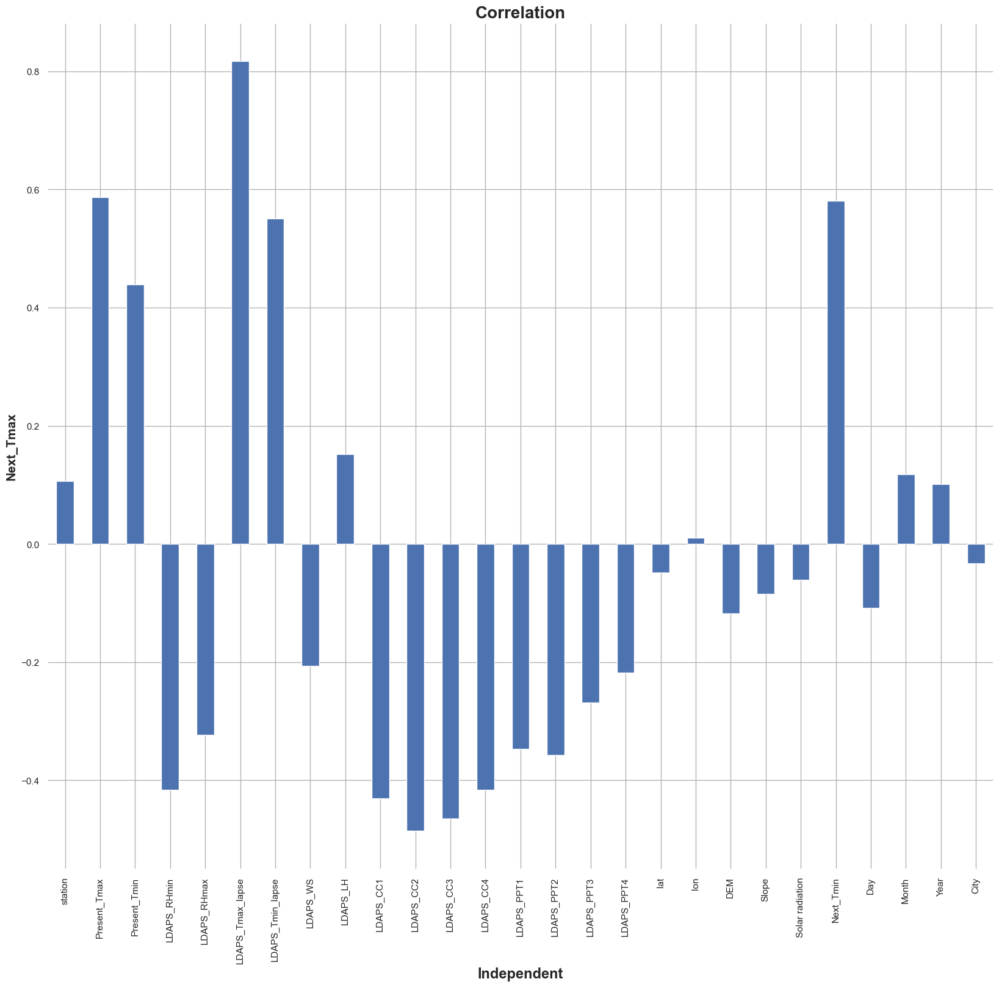

In [115]:
plt.figure(figsize = (20,18))
dfnew.corr()['Next_Tmax'].drop(['Next_Tmax']).plot(kind='bar')
plt.xlabel('Independent',fontsize=17)
plt.ylabel('Next_Tmax',fontsize=15)
plt.title('Correlation',fontsize = 20)
plt.show()

#Here we can see present(max/min) and tmax/minlapse along with latent heat and Nexttmin are positive correlated with the NextTmax. Whilst cloud cover, percipitation, Rhmin and other factors are negatively correlated with the target variable except for lat, lon, city


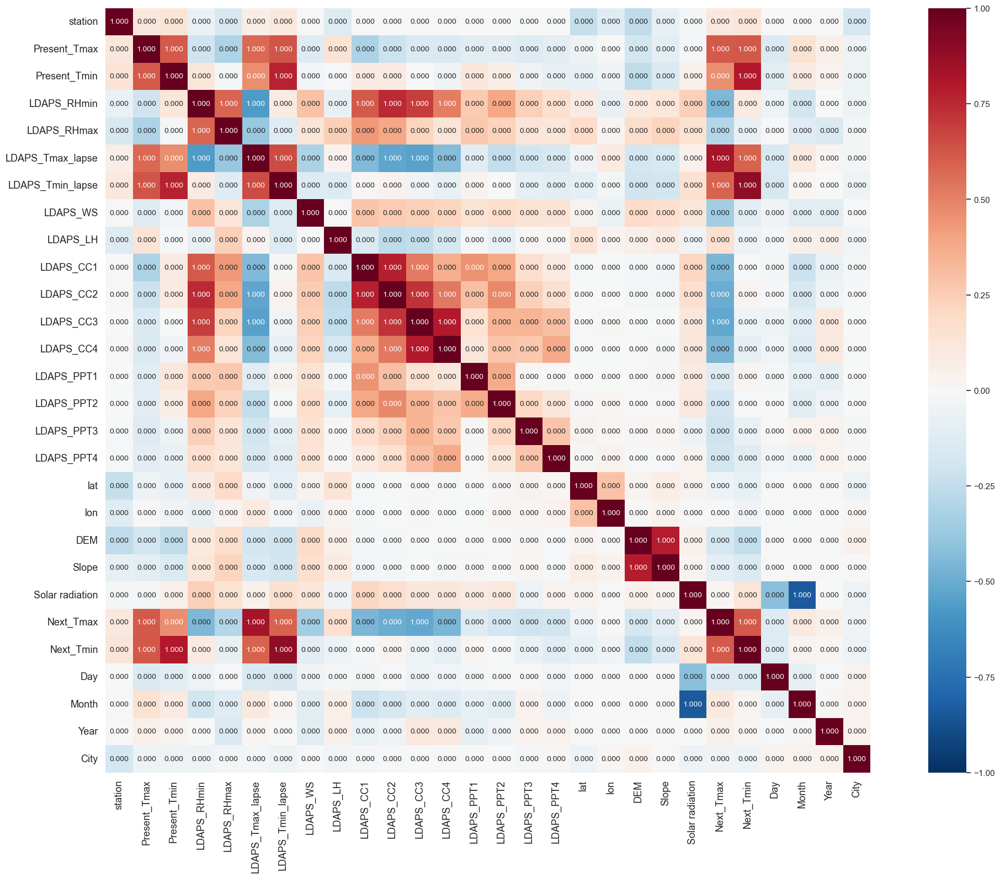

In [116]:
plt.figure(figsize=(27, 18))
corr_matrix = df.corr()
threshold = 0.5
a_mask = np.abs(corr_matrix) >= threshold
sns.heatmap(corr_matrix, vmin=-1, vmax=1, annot=a_mask, square=True, fmt='.3f',annot_kws={'size': 10}, cmap='RdBu_r')
plt.xticks(fontsize=13)
plt.yticks(fontsize=13)
plt.show()

#Here we can see some correlation between independent variables such as solar radiation and Month, cloud cover and lapsetmax , cloud cover and percipitation which was analysed earlier as well.


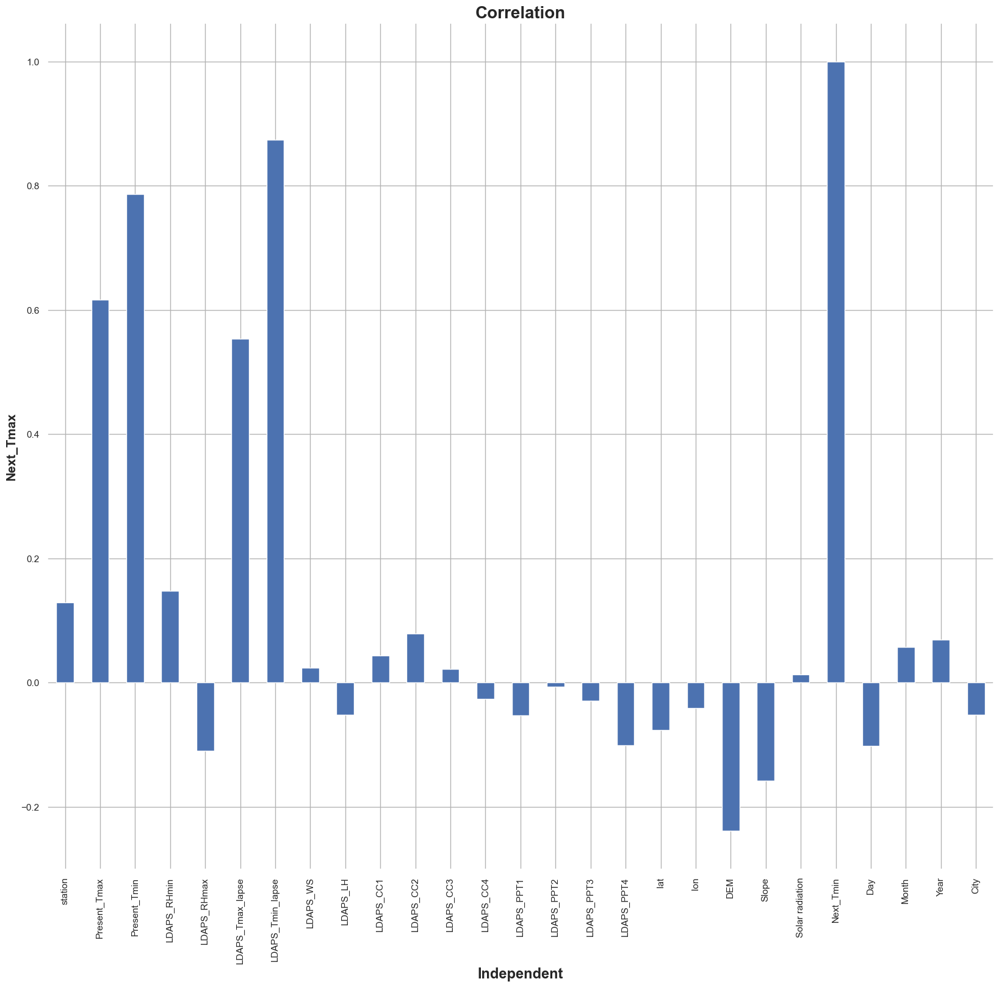

In [117]:
plt.figure(figsize = (20,18))
dfnew.corr()['Next_Tmin'].drop(['Next_Tmax']).plot(kind='bar')
plt.xlabel('Independent',fontsize=17)
plt.ylabel('Next_Tmax',fontsize=15)
plt.title('Correlation',fontsize = 20)
plt.show()

In [118]:
#here we can see very high positive correlation between present(min/max) & Next_min, lapse(min/max) and Next_min
#Also, a negative correlation between DEM and Slope with Next_tmin

In [119]:
#Now we can scale the data and move forward with PCA & VIF

In [120]:
X = dfnew.drop(['Next_Tmax'],axis=1)
Y = dfnew['Next_Tmax']

In [121]:
from sklearn.preprocessing import StandardScaler

In [122]:
Scaled= StandardScaler()
X_scale = Scaled.fit_transform(X)

In [123]:
from sklearn.decomposition import PCA

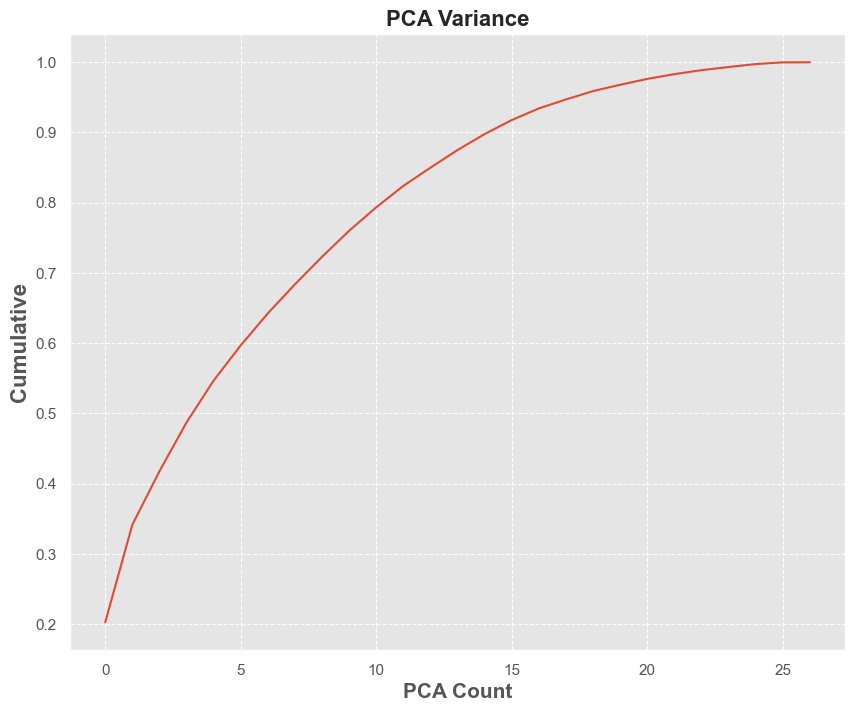

In [124]:
Pca = PCA()
PCA1 = Pca.fit_transform(X_scale)
plt.figure(figsize=(10, 8))
plt.style.use('ggplot')
plt.plot(np.cumsum(Pca.explained_variance_ratio_))
plt.xlabel('PCA Count', fontsize=15)
plt.ylabel('Cumulative', fontsize=16)
plt.title('PCA Variance', fontsize=16)
plt.grid(True, which='both', linestyle='--', linewidth=0.8)
plt.show()

In [125]:
#We can see that 15 components covers 90% of the variation

In [126]:
New_PCA1 = PCA(n_components=15)
X_new = New_PCA1.fit_transform(X_scale)

In [127]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [128]:
VIF=pd.DataFrame()
VIF['VIF']= [variance_inflation_factor(dfnew.values,i) for i in range(dfnew.shape[1])]
VIF['Independent Features']= dfnew.columns
VIF

,VIF,Independent Features
0,5.858403e+00,station
1,3.346732e+02,Present_Tmax
2,3.470768e+02,Present_Tmin
3,5.862180e+00,LDAPS_RHmin
4,2.576119e+00,LDAPS_RHmax
5,9.599533e+02,LDAPS_Tmax_lapse
6,8.496591e+00,LDAPS_Tmin_lapse
7,1.253253e+00,LDAPS_WS
8,1.566774e+00,LDAPS_LH
9,4.174642e+00,LDAPS_CC1


In [129]:
Final=pd.DataFrame(X_new,columns=np.arange(15))

In [130]:
from sklearn.linear_model import LinearRegression 
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.metrics import mean_absolute_error,mean_squared_error, r2_score
from xgboost import XGBRegressor
from sklearn.ensemble import GradientBoostingRegressor 
from sklearn.neighbors import KNeighborsRegressor as KNN
import xgboost as xgb
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVR
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import ExtraTreesRegressor
from sklearn.linear_model import  Ridge
from sklearn.linear_model import  Lasso as Lasso
from sklearn.ensemble import AdaBoostRegressor
from sklearn.linear_model import SGDRegressor
from sklearn.ensemble import StackingRegressor

In [131]:
Highest_Accuracy = 0
True_random_state = 0
for r in range(1,600):
    X_train,X_test,Y_train,Y_test = train_test_split(Final, Y, test_size = 0.10, random_state=r)
    LinearR = LinearRegression()
    LinearR.fit(X_train, Y_train)
    predictor=LinearR.predict(X_test)
    initialscore = r2_score(Y_test, predictor)
    if initialscore > Highest_Accuracy:
        Highest_Accuracy = initialscore
        True_random_state = r

print(f"True r2 Score: {Highest_Accuracy} at randomstate: {True_random_state}")

True r2 Score: 0.796326083515081 at randomstate: 472


In [132]:
X_train,X_test,Y_train,Y_test = train_test_split(Final, Y, test_size = 0.10, random_state=r)

In [133]:
LinearR = LinearRegression()
LinearR.fit(X_train, Y_train)
predict_LinearR=LinearR.predict(X_test)
pred_train=LinearR.predict(X_train)
print('r2_score:', r2_score (Y_test, predict_LinearR))
print('r2_score on given training data:',r2_score(Y_train, pred_train)*100)
print('MAE:', mean_absolute_error(Y_test, predict_LinearR))
print('MSE:', mean_squared_error(Y_test, predict_LinearR))
print('RSE:', np.sqrt(mean_squared_error(Y_test, predict_LinearR)))

r2_score: 0.7435502855140372
r2_score on given training data: 74.72971997349332
MAE: 1.0658028763466845
MSE: 2.101676241041469
RSE: 1.449715917358111


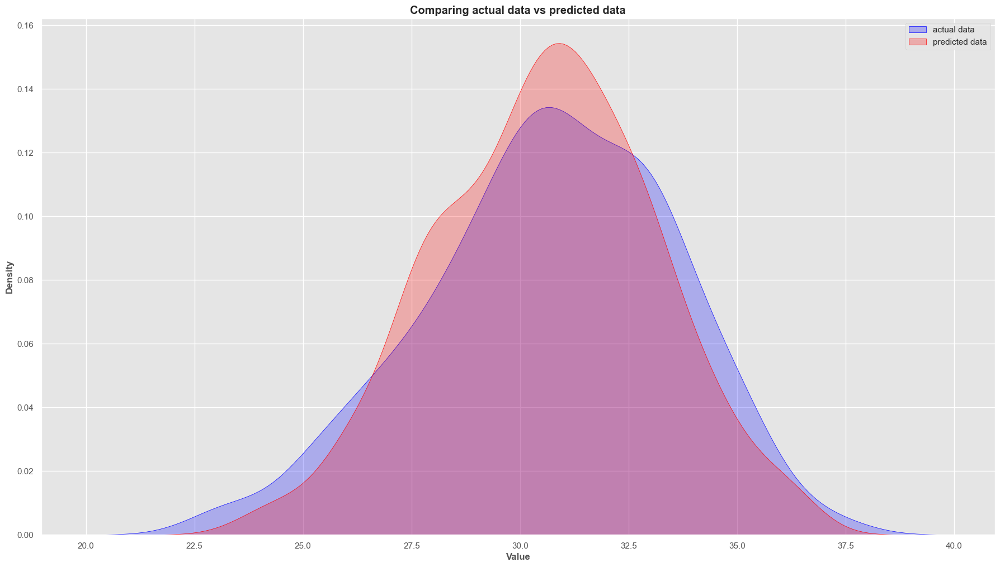

In [134]:
sns.kdeplot(Y_test, color="blue", label="actual data", shade=True)
sns.kdeplot(predict_LinearR, color="red", label="predicted data", shade=True)
plt.title('Comparing actual data vs predicted data')
plt.xlabel('Value')
plt.ylabel('Density')
plt.legend()
plt.show()

In [135]:
score = cross_val_score(LinearR,X,Y, scoring='r2')
print(score)
print(score.mean())

[0.66992637 0.68146398 0.683991   0.7766685  0.58687113]
0.6797841954957812


In [136]:
Lasso = Lasso()
Lasso.fit(X_train, Y_train)
predict_Lasso=Lasso.predict(X_test)
pred_train=Lasso.predict(X_train)
print('r2_score:', r2_score (Y_test, predict_Lasso))
print('r2_score on given training data:',r2_score(Y_train, pred_train)*100)
print('MAE:', mean_absolute_error(Y_test, predict_Lasso))
print('MSE:', mean_squared_error(Y_test, predict_Lasso))
print('RSE:', np.sqrt(mean_squared_error(Y_test, predict_Lasso)))

r2_score: 0.6103739179946803
r2_score on given training data: 60.13287791130138
MAE: 1.3598261157056142
MSE: 3.193093355872999
RSE: 1.7869228735099338


In [137]:
score = cross_val_score(Lasso,X,Y, scoring='r2')
print(score)
print(score.mean())

[0.60228314 0.60727115 0.65265756 0.67900496 0.61559019]
0.6313614006950166


In [138]:
rg = Ridge()
rg.fit(X_train, Y_train)
predict_rg=rg.predict(X_test)
pred_train=rg.predict(X_train)
print('r2_score:', r2_score (Y_test, predict_rg))
print('r2_score on given training data:',r2_score(Y_train, pred_train)*100)
print('MAE:', mean_absolute_error(Y_test, predict_rg))
print('MSE:', mean_squared_error(Y_test, predict_rg))
print('RSE:', np.sqrt(mean_squared_error(Y_test, predict_rg)))

r2_score: 0.7435519218229263
r2_score on given training data: 74.72971971215698
MAE: 1.0657962297567196
MSE: 2.101662831038178
RSE: 1.4497112923055329


In [139]:
score = cross_val_score(rg,X,Y, scoring='r2')
print(score)
print(score.mean())

[0.67992815 0.68120136 0.68605559 0.77523798 0.5850753 ]
0.6814996750916122


In [140]:
KNNmodel = KNN(n_neighbors=5)
KNNmodel.fit(X_train, Y_train)
predict_KNNmodel=KNNmodel.predict(X_test)
pred_train=KNNmodel.predict(X_train)
print('r2_score:', r2_score (Y_test, predict_KNNmodel))
print('r2_score on given training data:',r2_score(Y_train, pred_train)*100)
print('MAE:', mean_absolute_error(Y_test, predict_KNNmodel))
print('MSE:', mean_squared_error(Y_test, predict_KNNmodel))
print('RSE:', np.sqrt(mean_squared_error(Y_test, predict_KNNmodel)))

r2_score: 0.8530719773256096
r2_score on given training data: 89.21283334299355
MAE: 0.8520771513353118
MSE: 1.2041157270029677
RSE: 1.0973220707718256


In [141]:
score = cross_val_score(KNNmodel,X,Y, scoring='r2')
print(score)
print(score.mean())

[0.52773056 0.43071243 0.58110082 0.73542243 0.48101001]
0.5511952506841412


In [142]:
decisiontreeR = DecisionTreeRegressor()
decisiontreeR.fit(X_train, Y_train)
predict_decisiontreeR=decisiontreeR.predict(X_test)
pred_train=decisiontreeR.predict(X_train)
print('r2_score:', r2_score (Y_test, predict_decisiontreeR))
print('r2_score on given training data:',r2_score(Y_train, pred_train)*100)
print('MAE:', mean_absolute_error(Y_test, predict_decisiontreeR))
print('MSE:', mean_squared_error(Y_test, predict_decisiontreeR))
print('RSE:', np.sqrt(mean_squared_error(Y_test, predict_decisiontreeR)))

r2_score: 0.6242280526194552
r2_score on given training data: 100.0
MAE: 1.3112759643916914
MSE: 3.079554896142433
RSE: 1.7548660621661225


In [143]:
score = cross_val_score(decisiontreeR,X,Y, scoring='r2')
print(score)
print(score.mean())

[0.36417985 0.39852071 0.3577573  0.514267   0.35642009]
0.39822899066705786


In [144]:
GBregressor=GradientBoostingRegressor()
GBregressor.fit(X_train, Y_train)
predict_GBregressor=GBregressor.predict(X_test)
pred_train=GBregressor.predict(X_train)
print('r2_score:', r2_score (Y_test, predict_GBregressor))
print('r2_score on given training data:',r2_score(Y_train, pred_train)*100)
print('MAE:', mean_absolute_error(Y_test, predict_GBregressor))
print('MSE:', mean_squared_error(Y_test, predict_GBregressor))
print('RSE:', np.sqrt(mean_squared_error(Y_test, predict_GBregressor)))

r2_score: 0.7802385635487217
r2_score on given training data: 81.53339381376759
MAE: 1.0362363067602085
MSE: 1.8010056693281182
RSE: 1.342015524995191


In [145]:
score = cross_val_score(GBregressor,X,Y, scoring='r2')
print(score)
print(score.mean())

[0.74901055 0.65997211 0.70366044 0.78517316 0.64353394]
0.708270039104808


In [146]:
SGDR = SGDRegressor()
SGDR.fit(X_train, Y_train)
predict_SGDR=SGDR.predict(X_test)
pred_train=SGDR.predict(X_train)
print('r2_score:', r2_score (Y_test, predict_SGDR))
print('r2_score on given training data:',r2_score(Y_train, pred_train)*100)
print('MAE:', mean_absolute_error(Y_test, predict_SGDR))
print('MSE:', mean_squared_error(Y_test, predict_SGDR))
print('RSE:', np.sqrt(mean_squared_error(Y_test, predict_SGDR)))

r2_score: 0.7424155305414496
r2_score on given training data: 74.57029707181933
MAE: 1.0732861543712242
MSE: 2.110975871458572
RSE: 1.4529197746119955


In [147]:
score = cross_val_score(SGDR,X,Y, scoring='r2')
print(score)
print(score.mean())

[-5.90343281e+29 -3.82364327e+28 -5.15266372e+29 -1.59267200e+29
 -2.70367649e+29]
-3.1469618699715496e+29


In [148]:
supportVR=SVR(kernel='rbf')
supportVR.fit(X_train,Y_train)
predict_supportVR=supportVR.predict(X_test)
pred_train=supportVR.predict(X_train)
print('r2_score:', r2_score (Y_test, predict_supportVR))
print('r2_score on given training data:',r2_score(Y_train, pred_train)*100)
print('MAE:', mean_absolute_error(Y_test, predict_supportVR))
print('MSE:', mean_squared_error(Y_test, predict_supportVR))
print('RSE:', np.sqrt(mean_squared_error(Y_test, predict_supportVR)))

r2_score: 0.853198708712503
r2_score on given training data: 86.69242452919666
MAE: 0.8064796584448988
MSE: 1.203077128284454
RSE: 1.096848726253741


In [149]:
score = cross_val_score(supportVR,X,Y, scoring='r2')
print(score)
print(score.mean())

[-0.00267222 -0.21824072  0.01336095 -0.18182524 -0.01180531]
-0.08023650933887894


In [408]:
RandomFR=RandomForestRegressor(n_estimators=500,max_depth=None,min_samples_split=2,min_samples_leaf=1,max_features='sqrt',bootstrap=True,oob_score=False)
RandomFR.fit(X_train, Y_train)
predict_RandomFR=RandomFR.predict(X_test)
pred_train=RandomFR.predict(X_train)
print('r2_score:', r2_score (Y_test, predict_RandomFR))
print('r2_score on given training data:',r2_score(Y_train, pred_train)*100)
print('MAE:', mean_absolute_error(Y_test, predict_RandomFR))
print('MSE:', mean_squared_error(Y_test, predict_RandomFR))
print('RSE:', np.sqrt(mean_squared_error(Y_test, predict_RandomFR)))

r2_score: 0.8141473501251812
r2_score on given training data: 97.40431841609816
MAE: 0.938598516320475
MSE: 1.523113797804152
RSE: 1.2341449662840067


In [150]:
score = cross_val_score(RandomFR,X,Y, scoring='r2')
print(score)
print(score.mean())

NameError: name 'RandomFR' is not defined

In [ ]:
XtraTR=ExtraTreesRegressor(n_estimators=1000, max_depth=None, min_samples_split=2, min_samples_leaf=1, n_jobs=-1)
XtraTR.fit(X_train, Y_train)
predict_XtraTR=XtraTR.predict(X_test)
pred_train=XtraTR.predict(X_train)
print('r2_score:', r2_score (Y_test, predict_XtraTR))
print('r2_score on given training data:',r2_score(Y_train, pred_train)*100)
print('MAE:', mean_absolute_error(Y_test, predict_XtraTR))
print('MSE:', mean_squared_error(Y_test, predict_XtraTR))
print('RSE:', np.sqrt(mean_squared_error(Y_test, predict_XtraTR)))

In [ ]:
score = cross_val_score(XtraTR,X,Y, scoring='r2')
print(score)
print(score.mean())

In [ ]:
XGBR=XGBRegressor(n_estimators=1000,learning_rate=0.10,max_depth=6,min_child_weight=4,subsample=0.8,colsample_bytree=0.8,gamma=1,reg_alpha=0.5)
XGBR.fit(X_train, Y_train)
predict_XGBR=XGBR.predict(X_test)
pred_train=XGBR.predict(X_train)
print('r2_score:', r2_score (Y_test, predict_XGBR))
print('r2_score on given training data:',r2_score(Y_train, pred_train)*100)
print('MAE:', mean_absolute_error(Y_test, predict_XGBR))
print('MSE:', mean_squared_error(Y_test, predict_XGBR))
print('RSE:', np.sqrt(mean_squared_error(Y_test, predict_XGBR)))

In [ ]:
score = cross_val_score(XGBR,X,Y, scoring='r2')
print(score)
print(score.mean())

In [151]:
ADA=AdaBoostRegressor()
ADA.fit(X_train, Y_train)
predict_ADA=ADA.predict(X_test)
pred_train=ADA.predict(X_train)
print('r2_score:', r2_score (Y_test, predict_ADA))
print('r2_score on given training data:',r2_score(Y_train, pred_train)*100)
print('MAE:', mean_absolute_error(Y_test, predict_ADA))
print('MSE:', mean_squared_error(Y_test, predict_ADA))
print('RSE:', np.sqrt(mean_squared_error(Y_test, predict_ADA)))

r2_score: 0.6977477860909918
r2_score on given training data: 69.6994427639011
MAE: 1.2450000667654089
MSE: 2.477040374359696
RSE: 1.5738616122009252


In [152]:
score = cross_val_score(ADA,X,Y, scoring='r2')
print(score)
print(score.mean())

[0.6926814  0.61105572 0.6748455  0.71706378 0.60507854]
0.66014498935337


In [153]:
from sklearn.model_selection import GridSearchCV

In [157]:
params = {'n_estimators':[200,400,600,800],
              'booster' : ['gbtree','gblinear'],'max_depth':[2,4,6,8,10],
              'eta' : [0.01, 0.0001, 0.1] }

In [158]:
GCV = GridSearchCV(XGBRegressor(),params, verbose=5 )

In [159]:
GCV.fit(X_train,Y_train)

Fitting 5 folds for each of 120 candidates, totalling 600 fits
[CV 1/5] END booster=gbtree, eta=0.01, max_depth=2, n_estimators=200;, score=0.582 total time=   0.4s
[CV 2/5] END booster=gbtree, eta=0.01, max_depth=2, n_estimators=200;, score=0.598 total time=   0.0s
[CV 3/5] END booster=gbtree, eta=0.01, max_depth=2, n_estimators=200;, score=0.597 total time=   0.0s
[CV 4/5] END booster=gbtree, eta=0.01, max_depth=2, n_estimators=200;, score=0.587 total time=   0.0s
[CV 5/5] END booster=gbtree, eta=0.01, max_depth=2, n_estimators=200;, score=0.608 total time=   0.0s
[CV 1/5] END booster=gbtree, eta=0.01, max_depth=2, n_estimators=400;, score=0.675 total time=   0.2s
[CV 2/5] END booster=gbtree, eta=0.01, max_depth=2, n_estimators=400;, score=0.677 total time=   0.1s
[CV 3/5] END booster=gbtree, eta=0.01, max_depth=2, n_estimators=400;, score=0.689 total time=   0.1s
[CV 4/5] END booster=gbtree, eta=0.01, max_depth=2, n_estimators=400;, score=0.674 total time=   0.1s
[CV 5/5] END booste

GridSearchCV(estimator=XGBRegressor(base_score=None, booster=None,
                                    callbacks=None, colsample_bylevel=None,
                                    colsample_bynode=None,
                                    colsample_bytree=None, device=None,
                                    early_stopping_rounds=None,
                                    enable_categorical=False, eval_metric=None,
                                    feature_types=None, gamma=None,
                                    grow_policy=None, importance_type=None,
                                    interaction_constraints=None,
                                    learning_rate=None, max_bi...
                                    max_cat_to_onehot=None, max_delta_step=None,
                                    max_depth=None, max_leaves=None,
                                    min_child_weight=None, missing=nan,
                                    monotone_constraints=None,
                                    multi_strategy=None, n_estimators=None,
                                    n_jobs=None, num_parallel_tree=None,
                                    random_state=None, ...),
             param_grid={'booster': ['gbtree', 'gblinear'],
                         'eta': [0.01, 0.0001, 0.1],
                         'max_depth': [2, 4, 6, 8, 10],
                         'n_estimators': [200, 400, 600, 800]},
             verbose=5)

In [161]:
GCV.best_params_

{'booster': 'gbtree', 'eta': 0.1, 'max_depth': 8, 'n_estimators': 800}

In [162]:
Conclusivemodel =  XGBRegressor(n_estimators=800,booster='gbtree',eta= 0.1, max_depth= 8)
Conclusivemodel.fit(X_train, Y_train)
pred=Conclusivemodel.predict(X_test)
print('r2_score:', r2_score (Y_test, pred))
print('MAE:', mean_absolute_error(Y_test, pred))
print('MSE:', mean_squared_error(Y_test, pred))
print('RSE:', np.sqrt(mean_squared_error(Y_test, pred)))

r2_score: 0.8692486602810757
MAE: 0.7809387450402142
MSE: 1.071543342219811
RSE: 1.0351537770881247


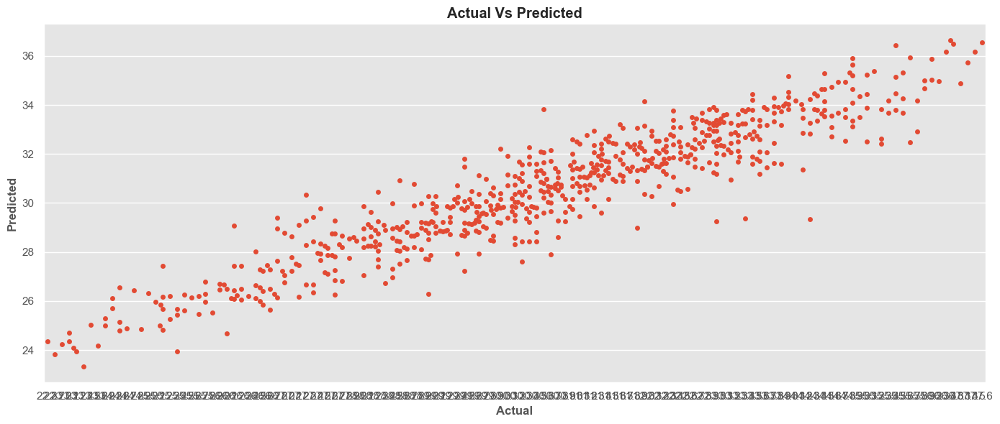

In [163]:
plt.figure(figsize=(14,6))
sns.swarmplot(x=Y_test, y=pred) 
plt.title('Actual Vs Predicted')
plt.xlabel('Actual', fontsize=12)
plt.ylabel('Predicted', fontsize=12)
plt.tight_layout()
plt.show()

In [193]:
import joblib
joblib.dump(Conclusivemodel,'Next_TmaxFinal.pkl')

['Next_TmaxFinal.pkl']

In [195]:
Model = joblib.load("Next_TmaxFinal.pkl")
true = np.array(Y_test)
predicted = np.array(Model.predict(X_test))
predicted_values = pd.DataFrame({"True Values":true,"Predicted Values":predicted},index= range(len(true)))
predicted_values

,True Values,Predicted Values
0,29.7,30.274321
1,26.1,25.691170
2,25.2,25.180048
3,33.9,32.626823
4,28.4,29.093912
...,...,...
669,26.1,25.030943
670,27.8,28.659485
671,25.2,25.249014
672,23.5,24.367880


In [ ]:
X = df.drop(['Next_Tmin'])
Y = df['Next_Tmin']

In [198]:
from sklearn.preprocessing import StandardScaler
Scaled= StandardScaler()
X_scale = Scaled.fit_transform(X)

In [202]:
Highest_Accuracy = 0
True_random_state = 0
for r in range(1,600):
    X_train,X_test,Y_train,Y_test = train_test_split(X_scale, Y, test_size = 0.10, random_state=r)
    LinearR = LinearRegression()
    LinearR.fit(X_train, Y_train)
    predictor=LinearR.predict(X_test)
    initialscore = r2_score(Y_test, predictor)
    if initialscore > Highest_Accuracy:
        Highest_Accuracy = initialscore
        True_random_state = r

print(f"True r2 Score: {Highest_Accuracy} at randomstate: {True_random_state}")

True r2 Score: 0.8285624037503591 at randomstate: 413


In [209]:
X_train,X_test,Y_train,Y_test = train_test_split(X_scale, Y, test_size = 0.10, random_state=r)

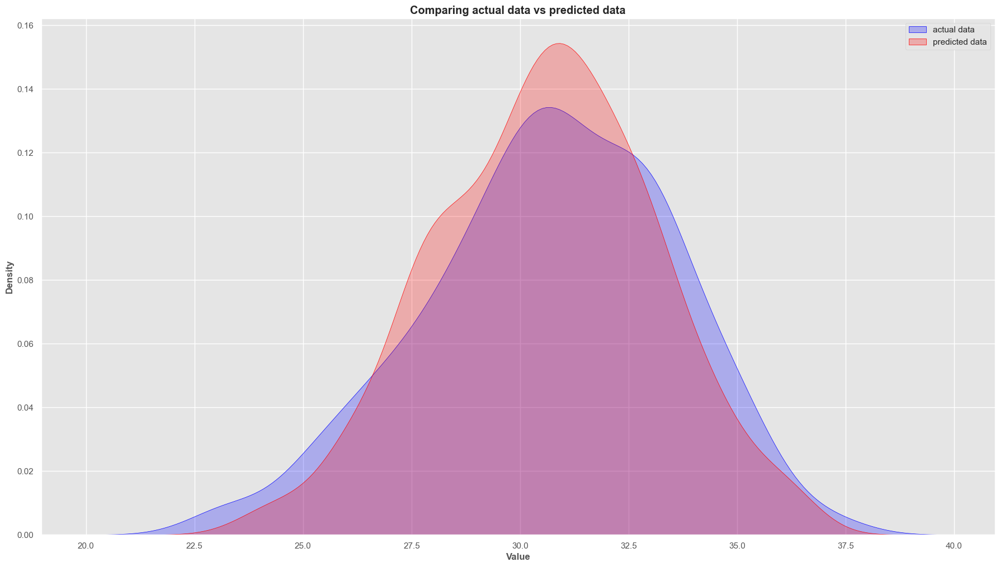

In [210]:
sns.kdeplot(Y_test, color="blue", label="actual data", shade=True)
sns.kdeplot(predict_LinearR, color="red", label="predicted data", shade=True)
plt.title('Comparing actual data vs predicted data')
plt.xlabel('Value')
plt.ylabel('Density')
plt.legend()
plt.show()

In [211]:
score = cross_val_score(LinearR,X,Y, scoring='r2')
print(score)
print(score.mean())

[0.66992637 0.68146398 0.683991   0.7766685  0.58687113]
0.6797841954957812


In [212]:
Lasso = Lasso()
Lasso.fit(X_train, Y_train)
predict_Lasso=Lasso.predict(X_test)
pred_train=Lasso.predict(X_train)
print('r2_score:', r2_score (Y_test, predict_Lasso))
print('r2_score on given training data:',r2_score(Y_train, pred_train)*100)
print('MAE:', mean_absolute_error(Y_test, predict_Lasso))
print('MSE:', mean_squared_error(Y_test, predict_Lasso))
print('RSE:', np.sqrt(mean_squared_error(Y_test, predict_Lasso)))

r2_score: 0.5669504135247319
r2_score on given training data: 54.96386377672011
MAE: 1.5026501632067502
MSE: 3.5489609684775902
RSE: 1.8838686176263966


In [213]:
score = cross_val_score(Lasso,X,Y, scoring='r2')
print(score)
print(score.mean())

[0.60228314 0.60727115 0.65265756 0.67900496 0.61559019]
0.6313614006950166


In [214]:
rg = Ridge()
rg.fit(X_train, Y_train)
predict_rg=rg.predict(X_test)
pred_train=rg.predict(X_train)
print('r2_score:', r2_score (Y_test, predict_rg))
print('r2_score on given training data:',r2_score(Y_train, pred_train)*100)
print('MAE:', mean_absolute_error(Y_test, predict_rg))
print('MSE:', mean_squared_error(Y_test, predict_rg))
print('RSE:', np.sqrt(mean_squared_error(Y_test, predict_rg)))

r2_score: 0.7848692669807726
r2_score on given training data: 79.1480972564121
MAE: 0.9896534530877605
MSE: 1.763055775712684
RSE: 1.3278011054795382


In [217]:
score = cross_val_score(rg,X,Y, scoring='r2')
print(score)
print(score.mean())

[0.67992815 0.68120136 0.68605559 0.77523798 0.5850753 ]
0.6814996750916122


In [218]:
KNNmodel = KNN(n_neighbors=5)
KNNmodel.fit(X_train, Y_train)
predict_KNNmodel=KNNmodel.predict(X_test)
pred_train=KNNmodel.predict(X_train)
print('r2_score:', r2_score (Y_test, predict_KNNmodel))
print('r2_score on given training data:',r2_score(Y_train, pred_train)*100)
print('MAE:', mean_absolute_error(Y_test, predict_KNNmodel))
print('MSE:', mean_squared_error(Y_test, predict_KNNmodel))
print('RSE:', np.sqrt(mean_squared_error(Y_test, predict_KNNmodel)))

r2_score: 0.8754937380840927
r2_score on given training data: 91.41560354944383
MAE: 0.775727002967359
MSE: 1.0203632047477744
RSE: 1.0101302909762555


In [220]:
score = cross_val_score(KNNmodel,X,Y, scoring='r2')
print(score)
print(score.mean())

[0.52773056 0.43071243 0.58110082 0.73542243 0.48101001]
0.5511952506841412


In [221]:
decisiontreeR = DecisionTreeRegressor()
decisiontreeR.fit(X_train, Y_train)
predict_decisiontreeR=decisiontreeR.predict(X_test)
pred_train=decisiontreeR.predict(X_train)
print('r2_score:', r2_score (Y_test, predict_decisiontreeR))
print('r2_score on given training data:',r2_score(Y_train, pred_train)*100)
print('MAE:', mean_absolute_error(Y_test, predict_decisiontreeR))
print('MSE:', mean_squared_error(Y_test, predict_decisiontreeR))
print('RSE:', np.sqrt(mean_squared_error(Y_test, predict_decisiontreeR)))

r2_score: 0.766862873281829
r2_score on given training data: 100.0
MAE: 0.9949554896142434
MSE: 1.910623145400593
RSE: 1.3822529238169812


In [222]:
score = cross_val_score(decisiontreeR,X,Y, scoring='r2')
print(score)
print(score.mean())

[0.3957321  0.37342271 0.38317313 0.49627299 0.36822989]
0.4033661647577082


In [223]:
GBregressor=GradientBoostingRegressor()
GBregressor.fit(X_train, Y_train)
predict_GBregressor=GBregressor.predict(X_test)
pred_train=GBregressor.predict(X_train)
print('r2_score:', r2_score (Y_test, predict_GBregressor))
print('r2_score on given training data:',r2_score(Y_train, pred_train)*100)
print('MAE:', mean_absolute_error(Y_test, predict_GBregressor))
print('MSE:', mean_squared_error(Y_test, predict_GBregressor))
print('RSE:', np.sqrt(mean_squared_error(Y_test, predict_GBregressor)))

r2_score: 0.8579305344941544
r2_score on given training data: 88.08790967924247
MAE: 0.8296311164929112
MSE: 1.1642985090842817
RSE: 1.0790266489222042


In [224]:
score = cross_val_score(GBregressor,X,Y, scoring='r2')
print(score)
print(score.mean())

[0.74897311 0.65998307 0.70300495 0.78445721 0.64404411]
0.708092491305847


In [225]:
SGDR = SGDRegressor()
SGDR.fit(X_train, Y_train)
predict_SGDR=SGDR.predict(X_test)
pred_train=SGDR.predict(X_train)
print('r2_score:', r2_score (Y_test, predict_SGDR))
print('r2_score on given training data:',r2_score(Y_train, pred_train)*100)
print('MAE:', mean_absolute_error(Y_test, predict_SGDR))
print('MSE:', mean_squared_error(Y_test, predict_SGDR))
print('RSE:', np.sqrt(mean_squared_error(Y_test, predict_SGDR)))

r2_score: 0.7817978595490336
r2_score on given training data: 78.77267588697111
MAE: 1.0007493440831057
MSE: 1.7882268079315469
RSE: 1.3372459788429154


In [227]:
score = cross_val_score(SGDR,X,Y, scoring='r2')
print(score)
print(score.mean())

[-6.49629490e+28 -4.71797310e+29 -3.91869325e+28 -3.34387391e+28
 -8.36822663e+27]
-1.2355083143435332e+29


In [228]:
supportVR=SVR(kernel='rbf')
supportVR.fit(X_train,Y_train)
predict_supportVR=supportVR.predict(X_test)
pred_train=supportVR.predict(X_train)
print('r2_score:', r2_score (Y_test, predict_supportVR))
print('r2_score on given training data:',r2_score(Y_train, pred_train)*100)
print('MAE:', mean_absolute_error(Y_test, predict_supportVR))
print('MSE:', mean_squared_error(Y_test, predict_supportVR))
print('RSE:', np.sqrt(mean_squared_error(Y_test, predict_supportVR)))

r2_score: 0.8937974721201719
r2_score on given training data: 91.34722069968338
MAE: 0.6907115248278779
MSE: 0.8703590488723137
RSE: 0.9329303558531653


In [230]:
score = cross_val_score(supportVR,X,Y, scoring='r2')
print(score)
print(score.mean())

[-0.00267222 -0.21824072  0.01336095 -0.18182524 -0.01180531]
-0.08023650933887894


In [232]:
RandomFR=RandomForestRegressor(n_estimators=500,max_depth=None,min_samples_split=2,min_samples_leaf=1,max_features='sqrt',bootstrap=True,oob_score=False)
RandomFR.fit(X_train, Y_train)
predict_RandomFR=RandomFR.predict(X_test)
pred_train=RandomFR.predict(X_train)
print('r2_score:', r2_score (Y_test, predict_RandomFR))
print('r2_score on given training data:',r2_score(Y_train, pred_train)*100)
print('MAE:', mean_absolute_error(Y_test, predict_RandomFR))
print('MSE:', mean_squared_error(Y_test, predict_RandomFR))
print('RSE:', np.sqrt(mean_squared_error(Y_test, predict_RandomFR)))

r2_score: 0.9176211424030429
r2_score on given training data: 98.88240396609285
MAE: 0.619931454005935
MSE: 0.6751174908605329
RSE: 0.8216553358072549


In [233]:
score = cross_val_score(RandomFR,X,Y, scoring='r2')
print(score)
print(score.mean())

[0.7271646  0.62583274 0.6875298  0.75556407 0.63694788]
0.6866078169751445


In [234]:
XtraTR=ExtraTreesRegressor(n_estimators=400, max_depth=None, min_samples_split=2, min_samples_leaf=1, n_jobs=-1)
XtraTR.fit(X_train, Y_train)
predict_XtraTR=XtraTR.predict(X_test)
pred_train=XtraTR.predict(X_train)
print('r2_score:', r2_score (Y_test, predict_XtraTR))
print('r2_score on given training data:',r2_score(Y_train, pred_train)*100)
print('MAE:', mean_absolute_error(Y_test, predict_XtraTR))
print('MSE:', mean_squared_error(Y_test, predict_XtraTR))
print('RSE:', np.sqrt(mean_squared_error(Y_test, predict_XtraTR)))

r2_score: 0.9300213079517208
r2_score on given training data: 100.0
MAE: 0.5777963649851624
MSE: 0.573494709291541
RSE: 0.7572943346490458


In [235]:
score = cross_val_score(XtraTR,X,Y, scoring='r2')
print(score)
print(score.mean())

[0.72794461 0.64536328 0.71364635 0.77023944 0.60518414]
0.6924755645917735


In [236]:
ADA=AdaBoostRegressor()
ADA.fit(X_train, Y_train)
predict_ADA=ADA.predict(X_test)
pred_train=ADA.predict(X_train)
print('r2_score:', r2_score (Y_test, predict_ADA))
print('r2_score on given training data:',r2_score(Y_train, pred_train)*100)
print('MAE:', mean_absolute_error(Y_test, predict_ADA))
print('MSE:', mean_squared_error(Y_test, predict_ADA))
print('RSE:', np.sqrt(mean_squared_error(Y_test, predict_ADA)))

r2_score: 0.7721422425222606
r2_score on given training data: 77.62738211827703
MAE: 1.0973634576154523
MSE: 1.8673572563254563
RSE: 1.366512808694253


In [237]:
score = cross_val_score(ADA,X,Y, scoring='r2')
print(score)
print(score.mean())

[0.6535838  0.62017186 0.66523755 0.71263417 0.60501884]
0.651329245150373


In [238]:
from sklearn.model_selection import GridSearchCV

In [249]:
params1 = {'n_estimators':[200,400,600,800],'max_features':['auto','sqrt','log2'], 'min_samples_split':[2,4], 'bootstrap':[True, False] , 'max_depth':[10,20,30],}

In [250]:
GCV = GridSearchCV(ExtraTreesRegressor(),params1, verbose=5 )

In [251]:
GCV.fit(X_train,Y_train)

Fitting 5 folds for each of 144 candidates, totalling 720 fits
[CV 1/5] END bootstrap=True, max_depth=10, max_features=auto, min_samples_split=2, n_estimators=200;, score=nan total time=   0.1s
[CV 2/5] END bootstrap=True, max_depth=10, max_features=auto, min_samples_split=2, n_estimators=200;, score=nan total time=   0.0s
[CV 3/5] END bootstrap=True, max_depth=10, max_features=auto, min_samples_split=2, n_estimators=200;, score=nan total time=   0.0s
[CV 4/5] END bootstrap=True, max_depth=10, max_features=auto, min_samples_split=2, n_estimators=200;, score=nan total time=   0.0s
[CV 5/5] END bootstrap=True, max_depth=10, max_features=auto, min_samples_split=2, n_estimators=200;, score=nan total time=   0.0s
[CV 1/5] END bootstrap=True, max_depth=10, max_features=auto, min_samples_split=2, n_estimators=400;, score=nan total time=   0.0s
[CV 2/5] END bootstrap=True, max_depth=10, max_features=auto, min_samples_split=2, n_estimators=400;, score=nan total time=   0.0s
[CV 3/5] END bootstr

GridSearchCV(estimator=ExtraTreesRegressor(),
             param_grid={'bootstrap': [True, False], 'max_depth': [10, 20, 30],
                         'max_features': ['auto', 'sqrt', 'log2'],
                         'min_samples_split': [2, 4],
                         'n_estimators': [200, 400, 600, 800]},
             verbose=5)

In [160]:
GCV.best_params_

{'booster': 'gbtree', 'eta': 0.1, 'max_depth': 8, 'n_estimators': 800}

In [256]:
Conclusivemodel1 =  ExtraTreesRegressor(bootstrap=False, max_depth=30, max_features='sqrt', min_samples_split=2, n_estimators=600)
Conclusivemodel1.fit(X_train, Y_train)
pred=Conclusivemodel1.predict(X_test)
print('r2_score:', r2_score (Y_test, pred))
print('MAE:', mean_absolute_error(Y_test, pred))
print('MSE:', mean_squared_error(Y_test, pred))
print('RSE:', np.sqrt(mean_squared_error(Y_test, pred)))

r2_score: 0.925709254035951
MAE: 0.5901763659900752
MSE: 0.608833182110778
RSE: 0.7802776314304916


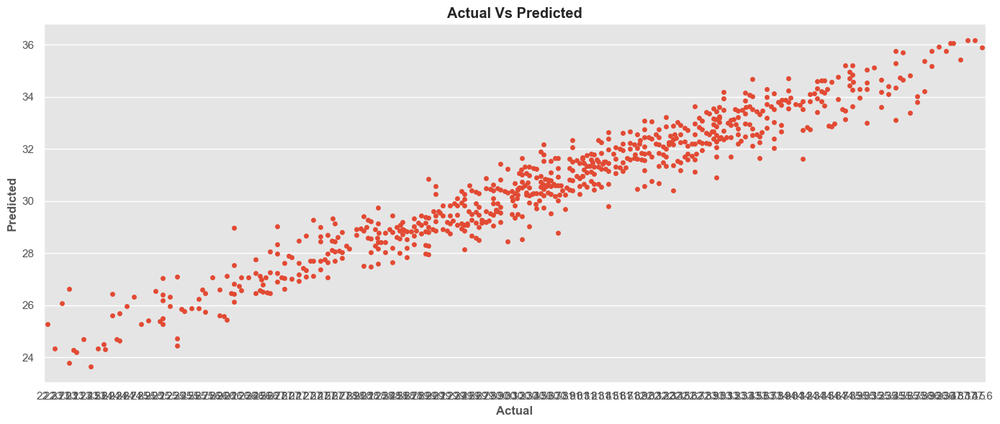

In [257]:
plt.figure(figsize=(14,6))
sns.swarmplot(x=Y_test, y=pred) 
plt.title('Actual Vs Predicted')
plt.xlabel('Actual', fontsize=12)
plt.ylabel('Predicted', fontsize=12)
plt.tight_layout()
plt.show()

In [ ]:
import joblib
joblib.dump(Conclusivemodel1,'Next_TminFinal.pkl')